Table of Contents

Vento ( wind_speed, wind_speed_hor, u, v, w)

- [Filter by Wind Dir](#Filter-By-Wind-Dir)

    - [U TrsV -> interessante](#u-TrsV)

- [Filter by AoA](#Filter-By-AoA)

- [Filter by AoA and Dir](#Filter-By-AoA-AND-Dir)

Flussi

- [Fluxes](#Fluxes)



In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
from wind_tools import *
import pandas as pd
import numpy as np
import os
from pathlib import Path
import seaborn as sns
import matplotlib
from windrose import WindroseAxes
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from itertools import product, cycle
#matplotlib.use('Qt5Agg')
import matplotlib.pyplot as plt
from collections import namedtuple
sns.set(style='whitegrid')
import plotly.express as px

matplotlib.rcParams['figure.figsize'] = (18,12)
# import matplotlib.font_manager
# matplotlib.rcParams['font.sans-serif'] = "Open-Sans"

In [ ]:
date_range = "index > '2020-08-13' and index < '2020-08-27 09:00'"

# Load High Freq data

In [ ]:
in_dir = Path('2020_data/data_field_v2_from_20208010/preprocessed/')
names = [
    '*_WM_174605_com1.csv',
     "*_TRS_M00506_com3.csv",
    "*_TRS_M00507_com2.csv",
]

In [ ]:
def make_long_df(name_re):
    return pd.concat([load_high_freq_data(f) for f in in_dir.glob(name_re)])

In [ ]:
def add_to_index(df, time='30min'):
    df.index += pd.Timedelta(time)
    return df

In [ ]:
wm1, TrsH, TrsV = map(lambda x: make_long_df(x)
                  .query(date_range)
                  .pipe(add_wind_dir)
                  .pipe(add_wind_speed)
                  .pipe(add_angle_attack)
                  .pipe(add_hor_wind_speed),
                  names)

not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200827-1518_WM_174605_com1.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200827-1507_WM_174605_com1.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200827-1519_WM_174605_com1.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200830-1359_WM_174605_com1.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200830-1358_WM_174605_com1.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200827-1519_TRS_M00506_com3.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200827-1518_TRS_M00506_com3.csv
not enough data 2020_data/data_field_v2_from_20208010/preprocessed/20200827-1507_TRS_M00507_com2.csv


In [ ]:
aggr_data['30min'][1]

,u,v,w,t,wind_dir,wind_speed,angle_attack,wind_speed_hor,Tau,H
2020-08-13 00:00:00,-0.015706,-0.291105,-0.016243,23.220147,220.341010,0.291980,-0.088233,0.534668,0.016800,0.004241
2020-08-13 00:30:00,0.040880,-0.009154,0.004246,23.271866,179.283156,0.042107,2.961158,0.410820,0.011441,0.004171
2020-08-13 01:00:00,-0.059221,-0.042274,0.026805,23.505132,194.539293,0.077541,6.967251,0.311057,0.008854,0.002514
2020-08-13 01:30:00,0.054582,-0.277181,-0.048392,22.888111,223.315698,0.286619,-0.318543,0.447762,0.043033,0.025001
2020-08-13 02:00:00,-0.003214,-0.365239,-0.024713,22.356196,254.053180,0.366088,-2.322307,0.459901,0.000905,0.000551
...,...,...,...,...,...,...,...,...,...,...
2020-08-30 10:30:00,0.208076,1.406656,0.073717,24.053079,123.737739,1.423872,3.109140,2.402834,0.157044,0.021173
2020-08-30 11:00:00,0.093764,0.337253,0.065738,24.107643,150.589750,0.356164,3.261204,1.420000,0.154376,0.004819
2020-08-30 11:30:00,0.177659,-0.000052,0.096621,24.518652,178.512253,0.202234,5.186668,1.644474,0.143848,0.009060
2020-08-30 12:00:00,0.145673,0.718558,0.064307,24.716860,153.635262,0.735991,3.497444,2.057126,0.220469,0.013447


In [ ]:

wm1, TrsH, TrsV = []

In [ ]:
plot_info_all=[{'label': 'WM1', 'color': sns.color_palette()[0]}, {'label': 'TrsH', 'color': sns.color_palette()[1]}, {'label': 'TrsV', 'color': sns.color_palette()[2]}]
plot_info_m7 = [{'label': 'WM1', 'color': sns.color_palette()[0]}, {'label': 'TrsV', 'color': sns.color_palette()[2]}]

## Calc Dir and AoA stats

In [ ]:
wm1_good_dir = filter_by_wind_dir(wm1, 250, 30).resample('30min').sum() / 18000

In [ ]:
wm1_good_dir

2020-08-13 00:00:00    0.419167
2020-08-13 00:30:00    0.323333
2020-08-13 01:00:00    0.273611
2020-08-13 01:30:00    0.266333
2020-08-13 02:00:00    0.171500
                         ...   
2020-08-27 06:30:00    0.180444
2020-08-27 07:00:00    0.070333
2020-08-27 07:30:00    0.121778
2020-08-27 08:00:00    0.173556
2020-08-27 08:30:00    0.176667
Freq: 30T, Name: wind_dir, Length: 690, dtype: float64

In [ ]:
wm1_good_aoa = ((wm1.angle_attack > -30) & (wm1.angle_attack < 30)).resample('30min').sum() / 18000

In [ ]:
wm1_good_aoa

2020-08-13 00:00:00    0.785778
2020-08-13 00:30:00    0.735389
2020-08-13 01:00:00    0.664222
2020-08-13 01:30:00    0.806444
2020-08-13 02:00:00    0.872056
                         ...   
2020-08-27 06:30:00    0.807444
2020-08-27 07:00:00    0.884278
2020-08-27 07:30:00    0.841500
2020-08-27 08:00:00    0.762389
2020-08-27 08:30:00    0.768833
Freq: 30T, Name: angle_attack, Length: 690, dtype: float64

## Load EP data

In [ ]:
proc_dir = Path("2020_data/data_field_v2_from_20208010/processed/30min")

# paths must be in order WM1, TrsH(M506), TrsV(M507)

Anems = namedtuple("Anemometers", 'WM1 TrsH TrsV')
ep_paths ={'30min':
           ["eddypro_WM1_30min_full_output_2020-08-25T121604_exp.csv",
            "eddypro_M506_30min_full_output_2020-08-25T122305_exp.csv",
            "eddypro_TRS_M507_30min_full_output_2020-08-25T120431_exp.csv"],
           '3min':
           ["../3min/eddypro_WM1_3min_full_output_2020-08-27T160147_exp.csv",
            "../3min/eddypro_TRS_M506_3min_full_output_2020-08-30T185335_exp.csv",
            "../3min/eddypro_TRS_M507_3min_full_output_2020-08-27T153846_exp.csv"],
           '15min':
           ["../15min/eddypro_WM1_15min_full_output_2020-08-30T180542_exp.csv",
           "../15min/eddypro_TRS_M506_15min_full_output_2020-08-30T182120_exp.csv",
           "../15min/eddypro_TRS_M507_15min_full_output_2020-08-30T181150_exp.csv"]}
ep_paths_filt_dir = {'15min':
           ["../filt_dir_15min/eddypro_WM1_filt_dir_15min_full_output_2020-08-31T081957_exp.csv",
           "../filt_dir_15min/eddypro_M506_filt_dir_15min_full_output_2020-08-31T082646_exp.csv",
           "../filt_dir_15min/eddypro_M507_filt_dir_15min_full_output_2020-08-31T081421_exp.csv"]}
# dir_filt_dir = proc_dir / "../filt_dir_5min"
# ep_paths_filt_dir_3m = ["eddypro_WM1_filt_dir_3min_full_output_2020-08-27T123821_exp.csv",
#             "eddypro_M506_filt_dir_3min_full_output_2020-08-27T101313_exp.csv",
#             "eddypro_TRS_M507_filt_dir_3min_full_output_2020-08-27T131041_exp.csv"]


cache_dir = Path("data_cache")

wind_cols = ['u_unrot','v_unrot', 'w_unrot', 'wind_speed', 'wind_dir', 'Tau', 'H', 'air_temperature', 'u*']
wind_comp_rename = {'u_unrot': 'u', 'v_unrot': 'v', 'w_unrot': 'w', 'air_temperature': 't'}

In [ ]:
data_ep = {time: Anems(*[
    load_ep_cache(proc_dir / p, cache_dir= cache_dir)
    .query(date_range)
    .pipe(add_to_index, '-'+time)
    .loc[:,wind_cols]
    .dropna()
    .rename(columns=wind_comp_rename)
    .pipe(add_hor_wind_speed)
    for p in ep_paths[time]])
    for time in ep_paths}

In [ ]:
ep_filt_dir= {time: Anems(*[
    load_ep_cache(proc_dir / p, cache_dir= cache_dir)
    .query(date_range)
    .loc[:,wind_cols]
    .dropna()
    .rename(columns=wind_comp_rename)
    .pipe(add_hor_wind_speed)
    for p in ep_paths_filt_dir[time]])
    for time in ep_paths_filt_dir.keys()}

In [ ]:
# wm1ep, TrsHep, TrsVep = map(
#     lambda p: load_ep_cache(proc_dir / p, cache_dir= cache_dir)
#     .query(date_range)
#     .loc[:,wind_cols]
#     .rename(columns=wind_comp_rename),
#     ep_paths)

# filt_dir_ep = list(map(
#     lambda p: load_ep_cache(dir_filt_dir / p, cache_dir= cache_dir)
#     .query(date_range)
#     .loc[:,wind_cols]
#     .dropna()
#     .rename(columns=wind_comp_rename),
#     ep_paths_filt_dir_3m))

# ep_3m = list(map(
#     lambda p: load_ep_cache(dir_3min / p, cache_dir= cache_dir)
#     .query(date_range)
#     .loc[:,wind_cols]
#     .dropna()
#     .rename(columns=wind_comp_rename),
#     ep_paths_3m))

In [ ]:
data_ep['3min'].WM1

,u,v,w,wind_speed,wind_dir,wind_speed_hor
date_time,,,,,,
2020-08-13 00:00:00,-0.130534,0.129894,0.044761,0.189590,12.45380,0.184151
2020-08-13 00:03:00,0.042194,0.361839,-0.056556,0.368655,86.71370,0.364291
2020-08-13 00:06:00,-0.090578,-0.314803,0.094039,0.340806,299.54400,0.327575
2020-08-13 00:09:00,-0.012028,-0.439050,-0.012183,0.439384,277.48100,0.439215
2020-08-13 00:12:00,-0.187033,-0.136367,0.074383,0.243126,338.61000,0.231468
...,...,...,...,...,...,...
2020-08-27 08:45:00,-0.200111,0.126489,0.079839,0.249836,30.94760,0.236736
2020-08-27 08:48:00,-1.198680,0.130872,0.078894,1.208380,3.41075,1.205803
2020-08-27 08:51:00,-1.143510,0.119681,0.013133,1.149830,5.15500,1.149756


# Scatters

In [ ]:
def plot_one_scatter(dfs, col, plot_info, ax=None, title=None, **kwargs):
    x = dfs[0]
    ax = ax or get_ax()
    ax.plot(x[col],x[col], color='gray', label=f"theory", lw=1, linestyle='dashed')
    ax.set_xlabel("Wind Master")
    ax.set_ylabel("Trisonica")
    ax.set_title(col + " " + (title or ""))
    
    for i in range(len(dfs)-1):
        info = plot_info[i+1]
        y = dfs[i+1]
        
        ax.scatter(x[col], y[col], **info ,**kwargs)
        # do linear regression
        x_np = np.expand_dims(x[col].to_numpy(), -1) # adding empty dimension for sklearn    
        reg = LinearRegression().fit(x_np, y[col]) 
        r2 = reg.score(x_np,  y[col])
        pred_y = reg.predict(x_np)
        # plot actual regression line  
        ax.plot(x_np, pred_y, color=info['color'], label=f"{info['label']}, r^2: {r2:.2f}, slope: {reg.coef_[0]:.2f}")
    
    ax.legend()


In [ ]:
aggr_data = {time: [add_raw_fluxes(df, time).pipe(add_wind_speed) for df in [wm1, TrsH, TrsV]] for time in ['3min', '5min', '10min', '15min', '30min']}

## Filters

In [ ]:
dir_filt = filter_by_wind_dir(wm1, 250, 30)

In [ ]:
aoa_filt = wm1.angle_attack.abs() < 30

In [ ]:
# when the aoa is outside teh TrsH range
    
not_good_aoa = {time: aoa_filt.resample(time).apply(lambda x: x.sum()/x.count() < .75) for time in aggr_data}

In [ ]:
good_dir = {time: dir_filt.resample(time).apply(lambda x: x.sum()/x.count() > .60) for time in aggr_data}

In [ ]:
not_good_aoa_and_dir = {time: good_dir[time] & not_good_aoa[time] for time in aggr_data }

In [ ]:
for k in good_dir:
    print(k, good_dir[k].sum(), good_dir[k].sum() / good_dir[k].count())

3min 1986 0.28782608695652173
5min 1150 0.2777777777777778
10min 553 0.26714975845410627
15min 353 0.25579710144927537
30min 169 0.24492753623188407


In [ ]:
for k in not_good_aoa:
    print(k, not_good_aoa[k].sum(), not_good_aoa[k].sum() / not_good_aoa[k].count())

3min 1588 0.2301449275362319
5min 890 0.21497584541062803
10min 377 0.1821256038647343
15min 221 0.16014492753623188
30min 89 0.1289855072463768
60min 33 0.09565217391304348


In [ ]:
aggr_data_dir_filt = {time: [add_raw_fluxes(df[dir_filt], time).pipe(add_wind_speed) for df in [wm1, TrsH, TrsV]] for time in ['3min', '5min', '10min', '15min', '30min']}

NameError: name 'dir_filt' is not defined

In [ ]:
unf_10m = [df.resample('10min').mean().dropna() for df in [wm1, TrsH, TrsV]]
filt_dir_10m = [df[dir_filt].resample('10min').mean().dropna() for df in [wm1, TrsH, TrsV]]
filt_aoa_10m = [df[aoa_filt].resample('10min').mean().dropna() for df in [wm1, TrsH, TrsV]]
filt_aoa_and_dir_10m = [df[aoa_filt & dir_filt].resample('10min').mean().dropna() for df in [wm1, TrsH, TrsV]]

/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


## Check data series alignment

In [ ]:
aggr_data['30min'][0]['2020-08-13 00:30:00':'2020-08-24 16:00:00']

,u,v,w,t,wind_dir,wind_speed,angle_attack,wind_speed_hor,Tau,H
2020-08-13 00:30:00,-0.025843,0.099128,-0.028467,24.987511,172.216432,0.410715,-3.578183,0.375042,0.017404,-0.014521
2020-08-13 01:00:00,-0.068027,-0.023997,-0.008589,25.322758,208.533532,0.322089,-0.566891,0.284584,0.010932,-0.007820
2020-08-13 01:30:00,-0.101196,-0.022520,0.007593,24.458247,204.478531,0.214061,-1.275614,0.199617,0.003446,0.005758
2020-08-13 02:00:00,-0.311580,-0.008636,0.026017,23.332024,162.961406,0.409132,1.938530,0.392725,0.013432,0.006270
2020-08-13 02:30:00,-0.264866,0.158393,0.027034,24.219813,67.401563,0.354745,3.032955,0.342485,0.003804,0.007533
...,...,...,...,...,...,...,...,...,...,...
2020-08-24 14:00:00,0.472083,-2.152718,-0.023923,32.819871,257.888947,2.672763,1.811895,2.542995,0.252076,0.300258
2020-08-24 14:30:00,0.043589,-2.393906,0.066534,32.467029,267.452605,2.954546,3.972740,2.817192,0.337623,0.285490
2020-08-24 15:00:00,0.072869,-2.162910,-0.027498,32.176162,267.357933,2.668477,1.602374,2.535732,0.241560,0.257683
2020-08-24 15:30:00,0.625718,-2.045926,-0.096339,31.552072,253.004855,2.599816,-0.191898,2.459820,0.319792,0.225494


In [ ]:
add_wind_speed(aggr_data['30min'][0])

,u,v,w,t,wind_dir,wind_speed,angle_attack,wind_speed_hor,Tau,H
2020-08-13 01:30:00,-0.119138,-0.144084,0.023496,24.867228,206.366349,0.188431,3.215608,0.444823,0.011612,-0.004761
2020-08-13 02:00:00,-0.025843,0.099128,-0.028467,24.987511,172.216432,0.106323,-3.578183,0.375042,0.017404,-0.014521
2020-08-13 02:30:00,-0.068027,-0.023997,-0.008589,25.322758,208.533532,0.072645,-0.566891,0.284584,0.010932,-0.007820
2020-08-13 03:00:00,-0.101196,-0.022520,0.007593,24.458247,204.478531,0.103949,-1.275614,0.199617,0.003446,0.005758
2020-08-13 03:30:00,-0.311580,-0.008636,0.026017,23.332024,162.961406,0.312784,1.938530,0.392725,0.013432,0.006270
...,...,...,...,...,...,...,...,...,...,...
2020-08-27 08:00:00,-0.766819,0.245744,0.103504,19.844453,140.274342,0.811859,6.249385,1.109028,0.044604,-0.013895
2020-08-27 08:30:00,-1.089718,0.150282,0.073088,19.597876,130.279805,1.102457,4.921575,1.184195,0.011627,-0.012514
2020-08-27 09:00:00,-1.200732,0.204361,0.114315,20.117163,135.964703,1.223352,7.330514,1.409334,0.042869,0.009462
2020-08-27 09:30:00,-0.621564,0.173821,0.059810,21.501850,147.445868,0.648176,4.905612,0.938310,0.034139,0.006540


In [ ]:
myd = add_wind_speed(aggr_data['30min'][0])
myd.index = myd.index + pd.Timedelta('30min')
myd = myd[:'2020-08-24 16:00:00']

In [ ]:
aggr_data['30min'][0]

,u,v,w,t,wind_dir,wind_speed,angle_attack,wind_speed_hor,Tau,H
2020-08-13 00:00:00,-0.119138,-0.144084,0.023496,24.867228,206.366349,0.478623,3.215608,0.444823,0.011612,-0.004761
2020-08-13 00:30:00,-0.025843,0.099128,-0.028467,24.987511,172.216432,0.410715,-3.578183,0.375042,0.017404,-0.014521
2020-08-13 01:00:00,-0.068027,-0.023997,-0.008589,25.322758,208.533532,0.322089,-0.566891,0.284584,0.010932,-0.007820
2020-08-13 01:30:00,-0.101196,-0.022520,0.007593,24.458247,204.478531,0.214061,-1.275614,0.199617,0.003446,0.005758
2020-08-13 02:00:00,-0.311580,-0.008636,0.026017,23.332024,162.961406,0.409132,1.938530,0.392725,0.013432,0.006270
...,...,...,...,...,...,...,...,...,...,...
2020-08-27 06:30:00,-0.766819,0.245744,0.103504,19.844453,140.274342,1.183514,6.249385,1.109028,0.044604,-0.013895
2020-08-27 07:00:00,-1.089718,0.150282,0.073088,19.597876,130.279805,1.232806,4.921575,1.184195,0.011627,-0.012514
2020-08-27 07:30:00,-1.200732,0.204361,0.114315,20.117163,135.964703,1.480243,7.330514,1.409334,0.042869,0.009462
2020-08-27 08:00:00,-0.621564,0.173821,0.059810,21.501850,147.445868,1.015751,4.905612,0.938310,0.034139,0.006540


In [ ]:
aggr_data['15min'][0])

,u,v,w,t,wind_dir,wind_speed,angle_attack,wind_speed_hor,Tau,H
2020-08-13 00:00:00,-0.119138,-0.144084,0.023496,24.867228,206.366349,0.188431,3.215608,0.444823,0.011612,-0.004761
2020-08-13 00:30:00,-0.025843,0.099128,-0.028467,24.987511,172.216432,0.106323,-3.578183,0.375042,0.017404,-0.014521
2020-08-13 01:00:00,-0.068027,-0.023997,-0.008589,25.322758,208.533532,0.072645,-0.566891,0.284584,0.010932,-0.007820
2020-08-13 01:30:00,-0.101196,-0.022520,0.007593,24.458247,204.478531,0.103949,-1.275614,0.199617,0.003446,0.005758
2020-08-13 02:00:00,-0.311580,-0.008636,0.026017,23.332024,162.961406,0.312784,1.938530,0.392725,0.013432,0.006270
...,...,...,...,...,...,...,...,...,...,...
2020-08-27 06:30:00,-0.766819,0.245744,0.103504,19.844453,140.274342,0.811859,6.249385,1.109028,0.044604,-0.013895
2020-08-27 07:00:00,-1.089718,0.150282,0.073088,19.597876,130.279805,1.102457,4.921575,1.184195,0.011627,-0.012514
2020-08-27 07:30:00,-1.200732,0.204361,0.114315,20.117163,135.964703,1.223352,7.330514,1.409334,0.042869,0.009462
2020-08-27 08:00:00,-0.621564,0.173821,0.059810,21.501850,147.445868,0.648176,4.905612,0.938310,0.034139,0.006540


In [ ]:
data_ep['15min'][0]

,u,v,w,wind_speed,wind_dir,wind_speed_hor
date_time,,,,,,
2020-08-13 00:00:00,-0.075679,-0.079828,0.028883,0.113746,330.8570,0.109999
2020-08-13 00:15:00,-0.162674,-0.208362,0.018108,0.264964,326.5950,0.264344
2020-08-13 00:30:00,-0.092196,0.121854,-0.019139,0.154022,35.7102,0.152802
2020-08-13 00:45:00,0.040576,0.076371,-0.037803,0.094382,92.8913,0.086481
2020-08-13 01:00:00,-0.083123,-0.117447,-0.009501,0.144255,305.7070,0.143886
...,...,...,...,...,...,...
2020-08-27 07:45:00,-0.987908,0.240773,0.125833,1.024580,14.1915,1.016825
2020-08-27 08:00:00,-0.568513,0.190867,0.093879,0.607156,17.8634,0.599698
2020-08-27 08:15:00,-0.674416,0.156762,0.025882,0.692879,11.9524,0.692395


ValueError: x and y must be the same size

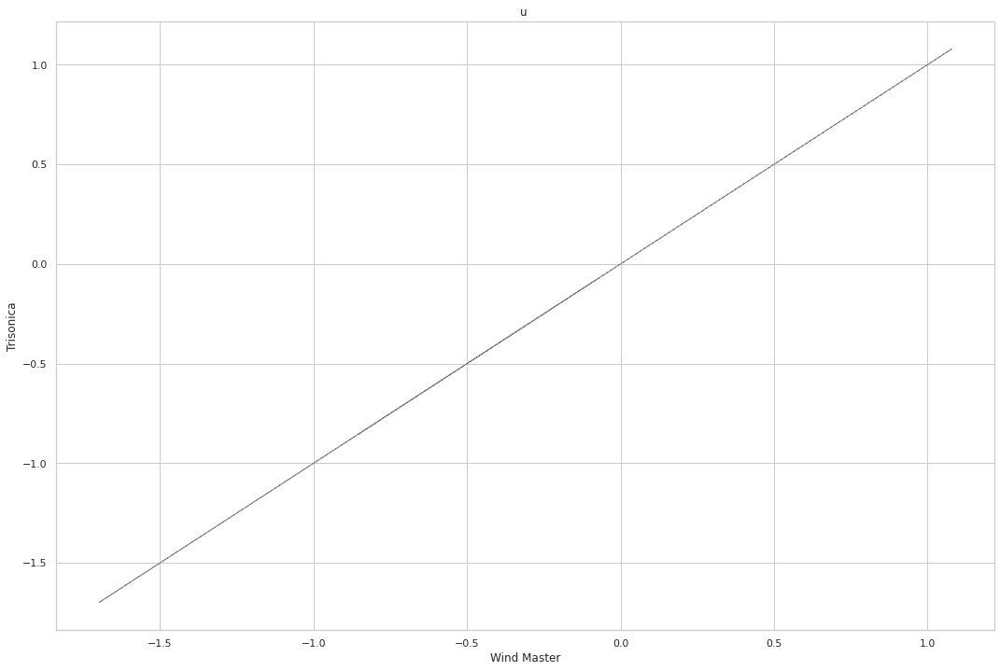

In [ ]:
plot_one_scatter([data_ep['15min'][0], aggr_data['15min'][0][:'2020-08-24 15:30:00']], 'u', plot_info_all)

## All in One

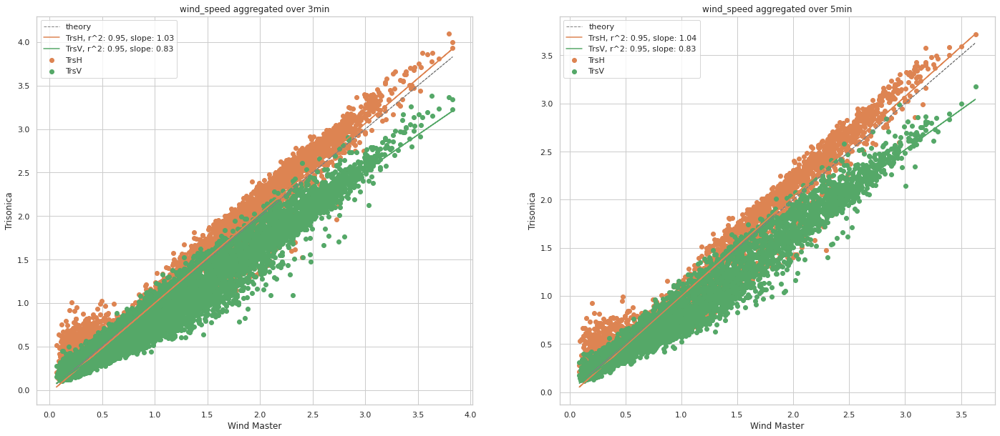

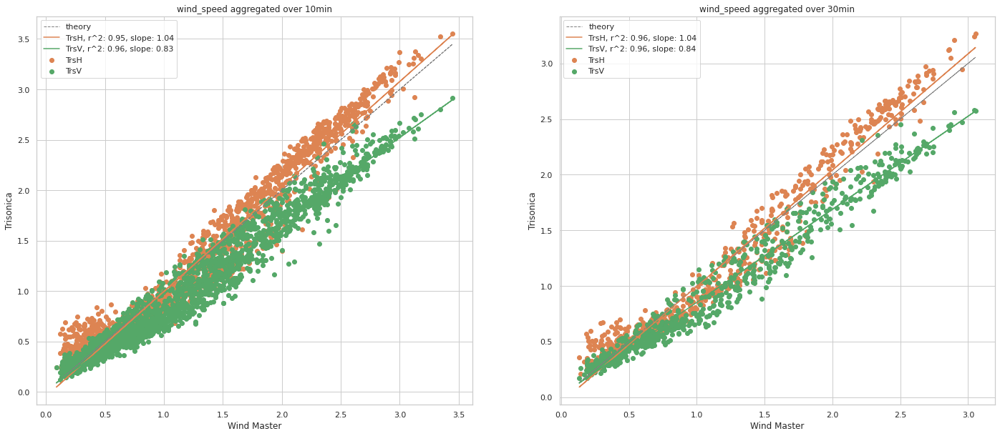

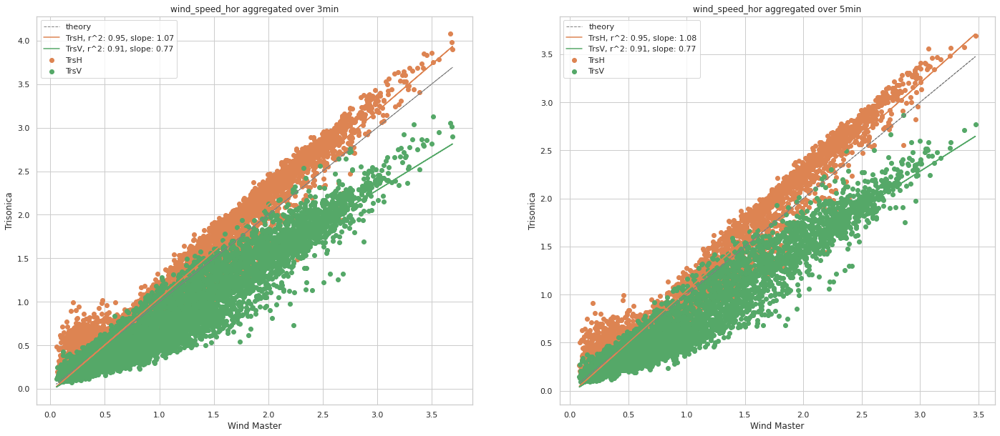

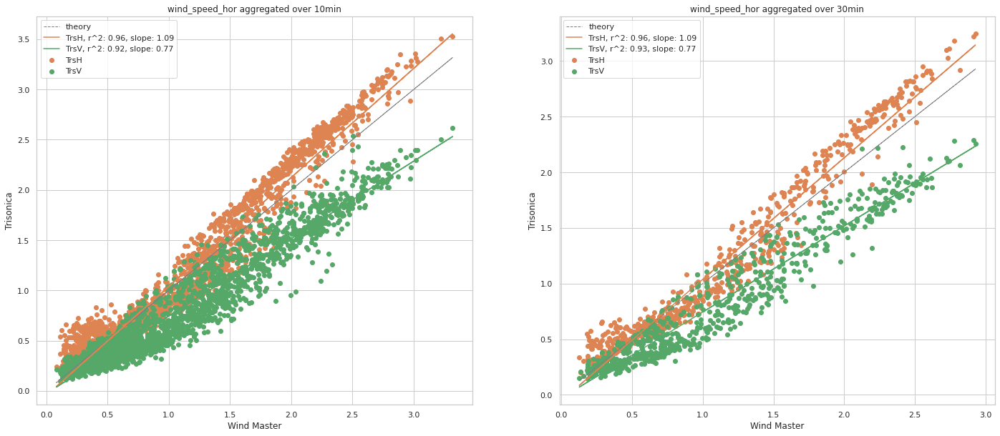

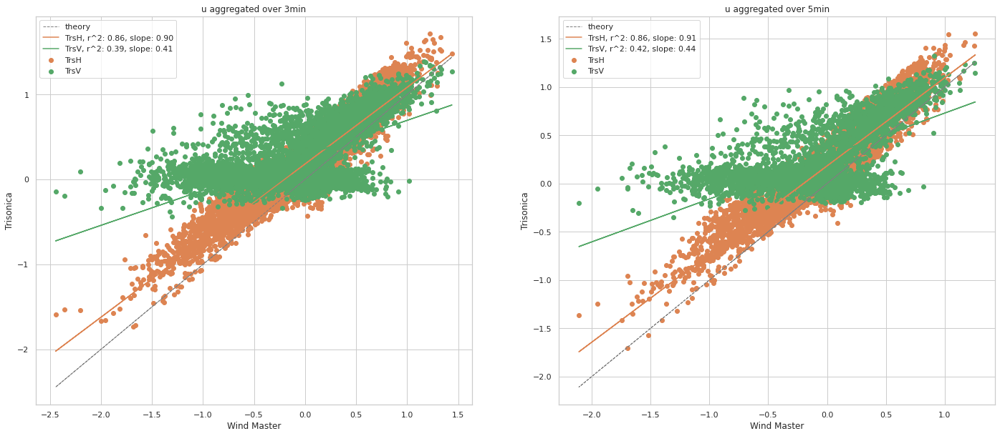

...

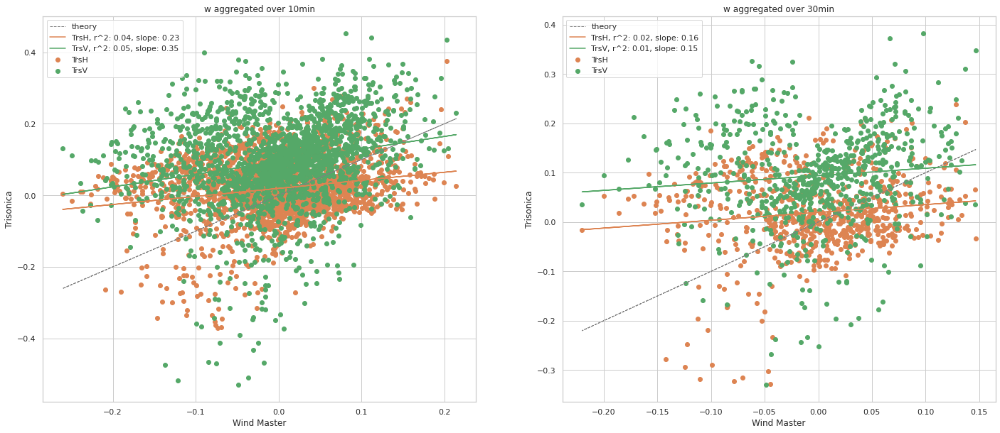

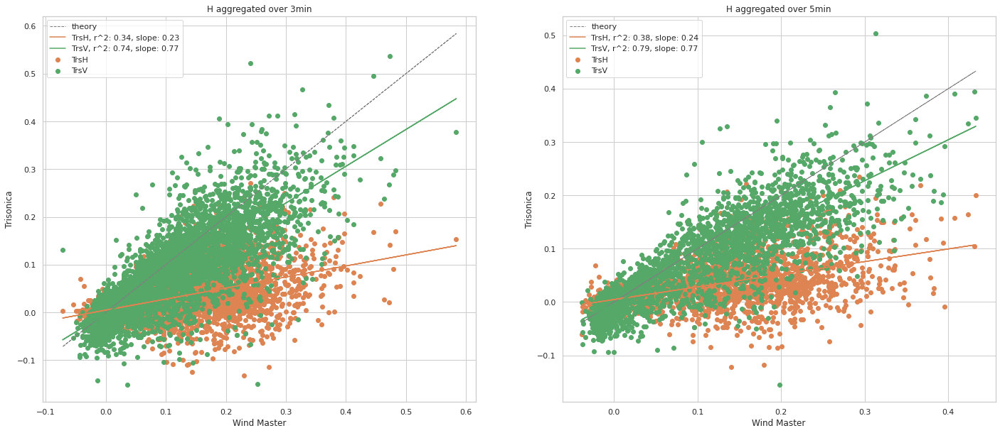

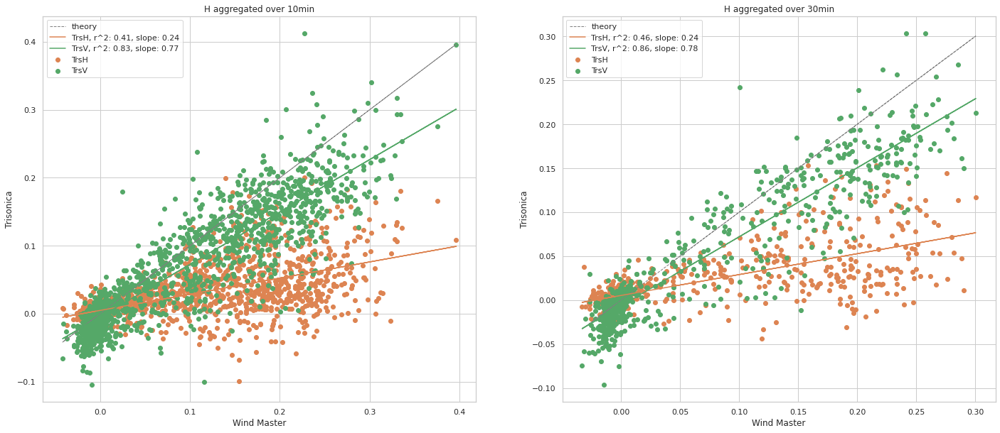

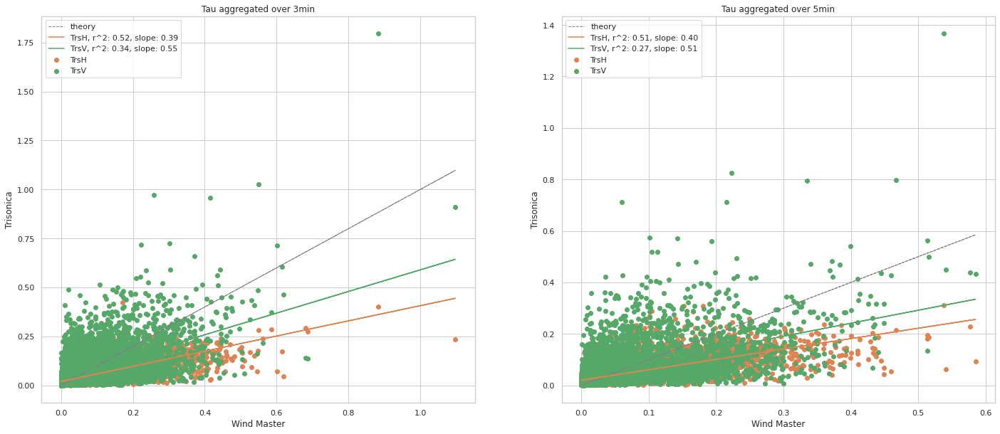

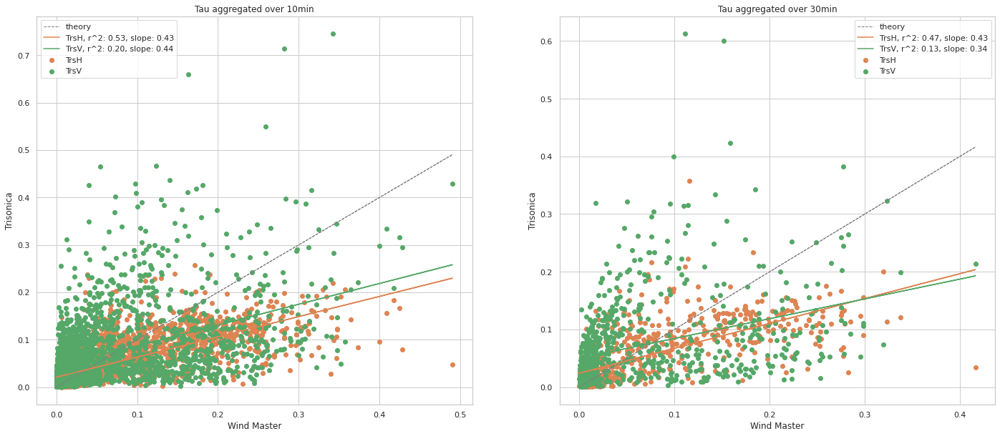

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for (col, time), ax_idx in zip( product(['wind_speed', 'wind_speed_hor', 'u', 'v', 'w', 'H', 'Tau' ], ['3min', '5min', '10min', '30min']), cycle([0,1])):
    if ax_idx==0: axes = get_ax(1,2)
    plot_one_scatter(aggr_data[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[ax_idx])

## Filtered by amount of data in the interval

/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


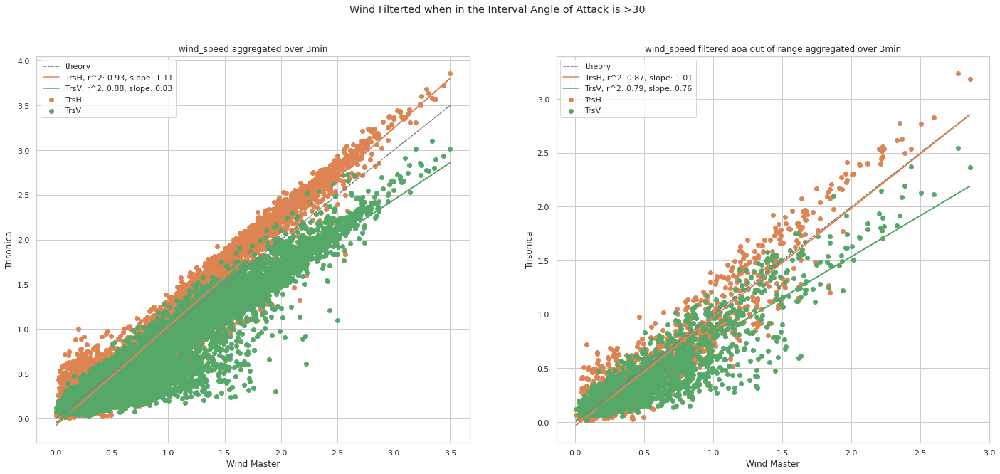

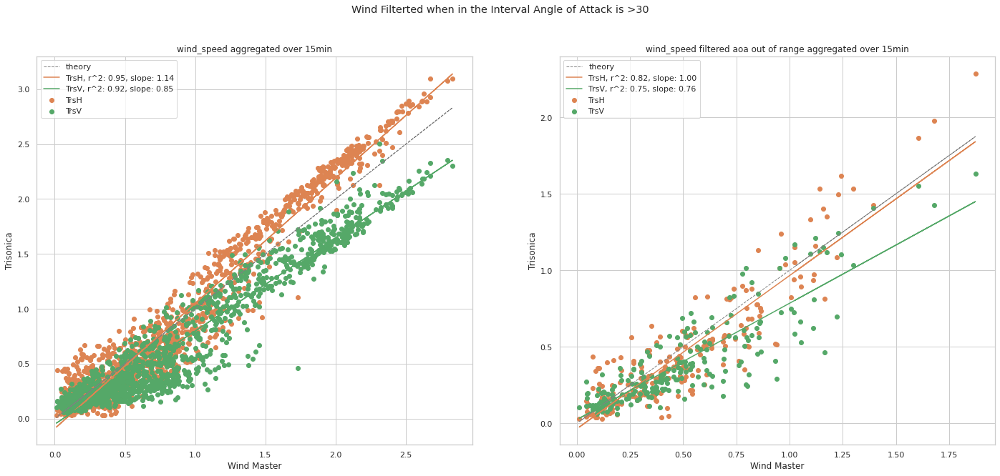

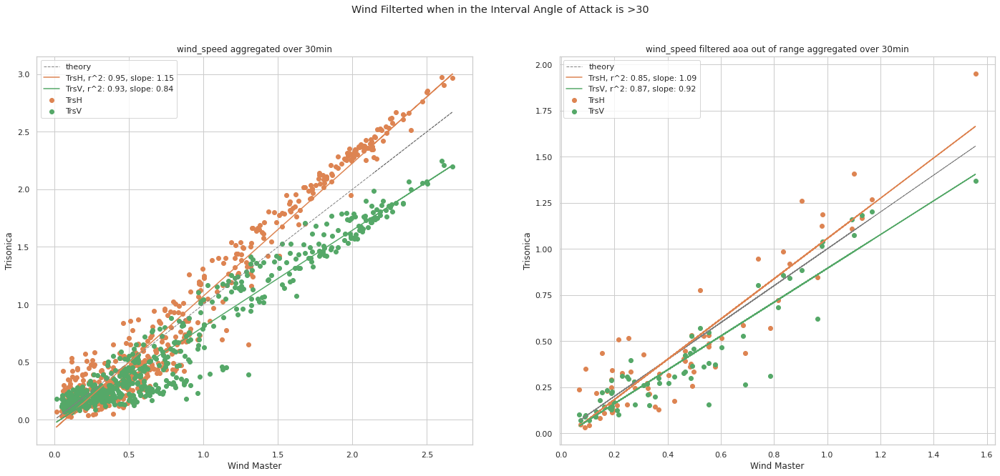

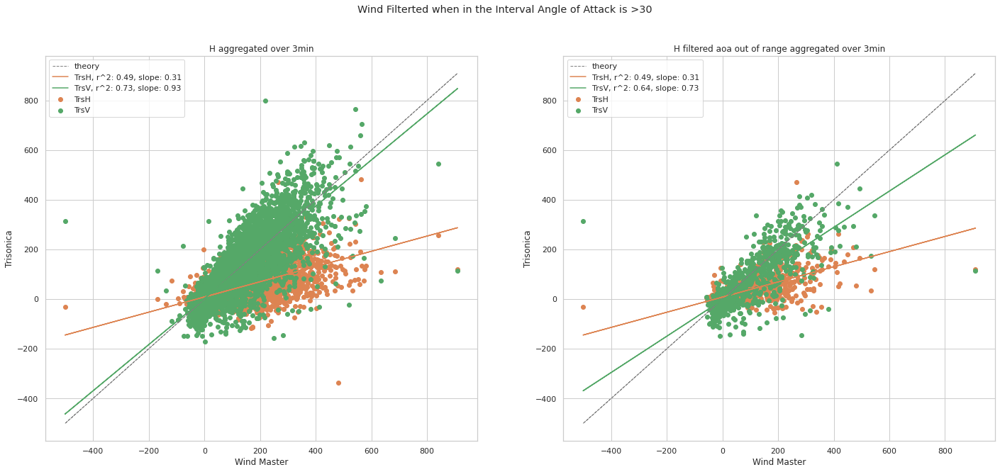

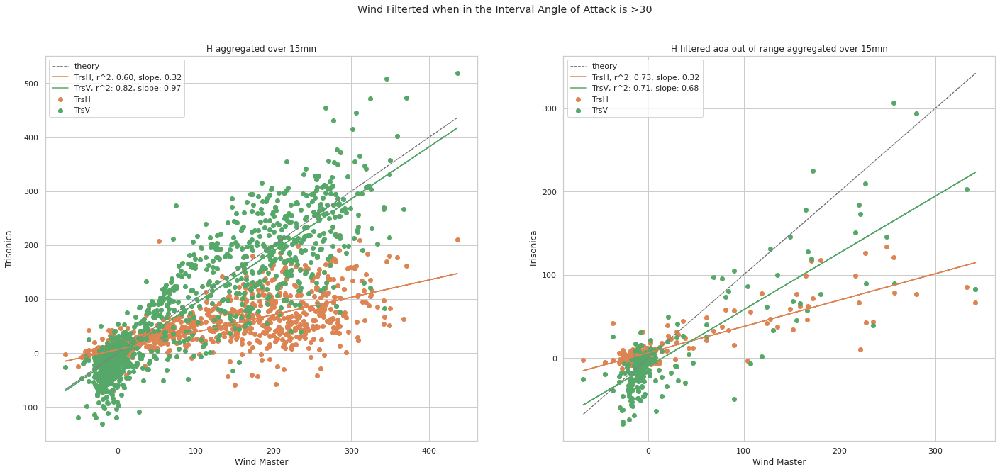

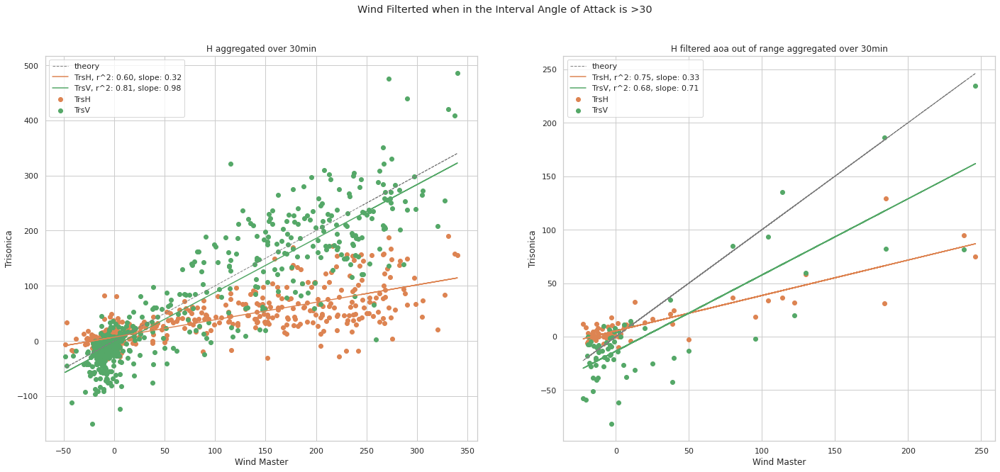

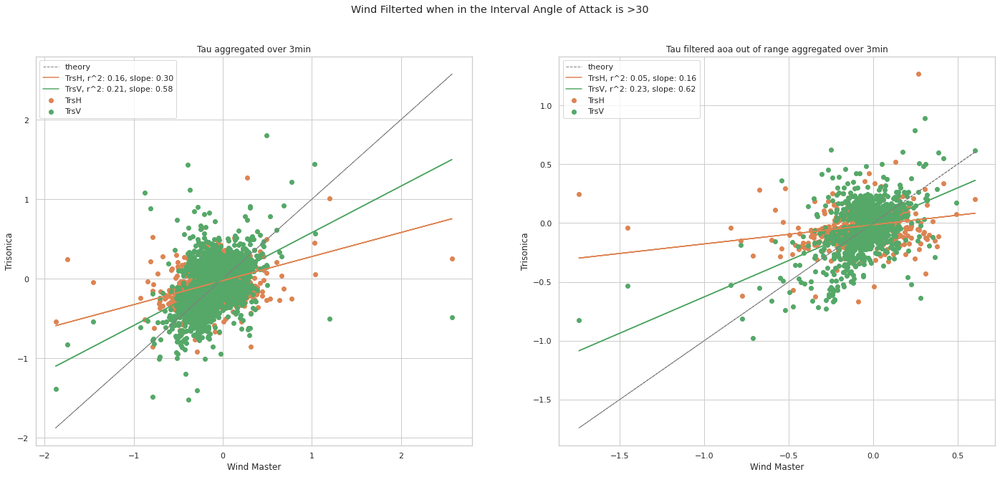

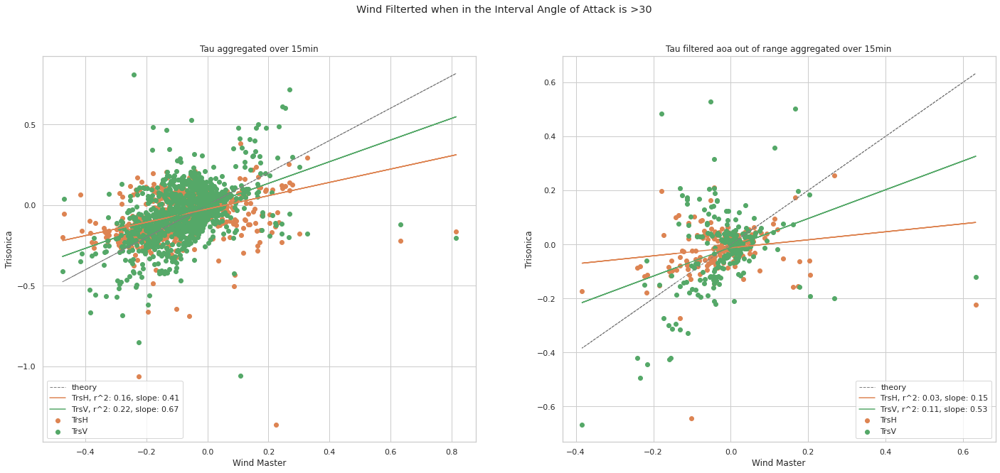

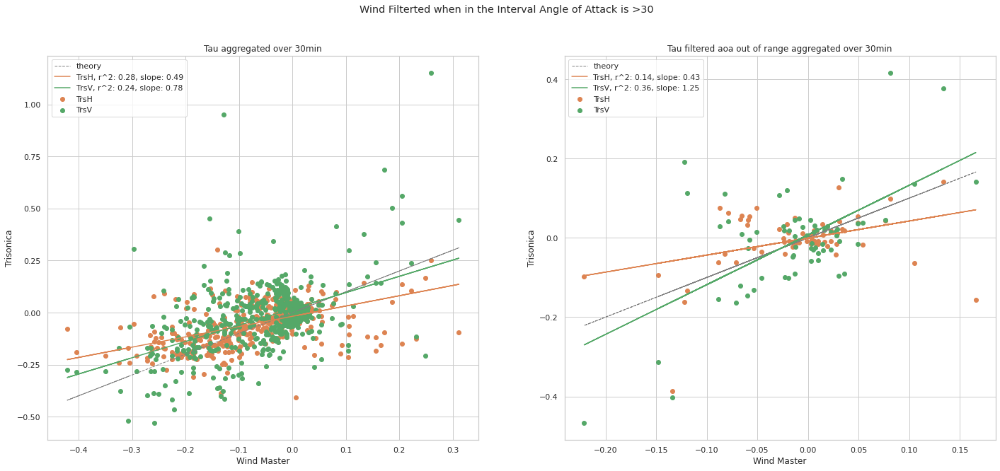

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for col, time in product(['wind_speed', 'H', 'Tau' ], ['3min', '15min', '30min']):
    axes = get_ax(1,2)
    plot_one_scatter(data_ep[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[0])
    plot_one_scatter([df[:-1][not_good_aoa[time][1:]] for df in data_ep[time]], col, plot_info_all, title=f"filtered aoa out of range aggregated over {time}", ax=axes[1])
    plt.suptitle("Wind Filterted when in the Interval Angle of Attack is >30 for at least 25% of the time (EP Fluxes)")

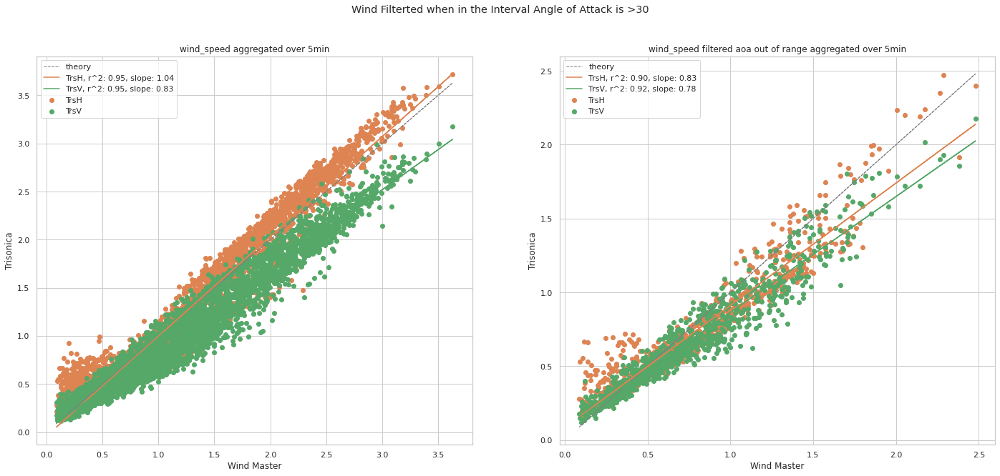

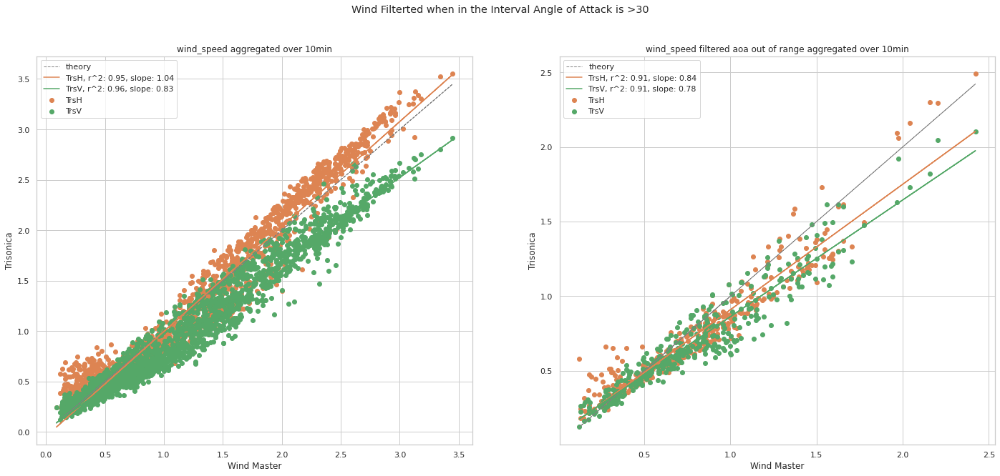

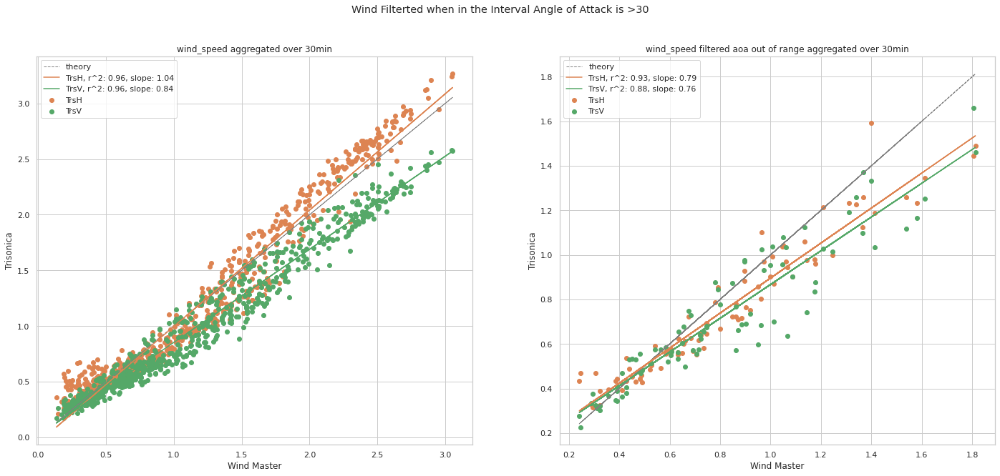

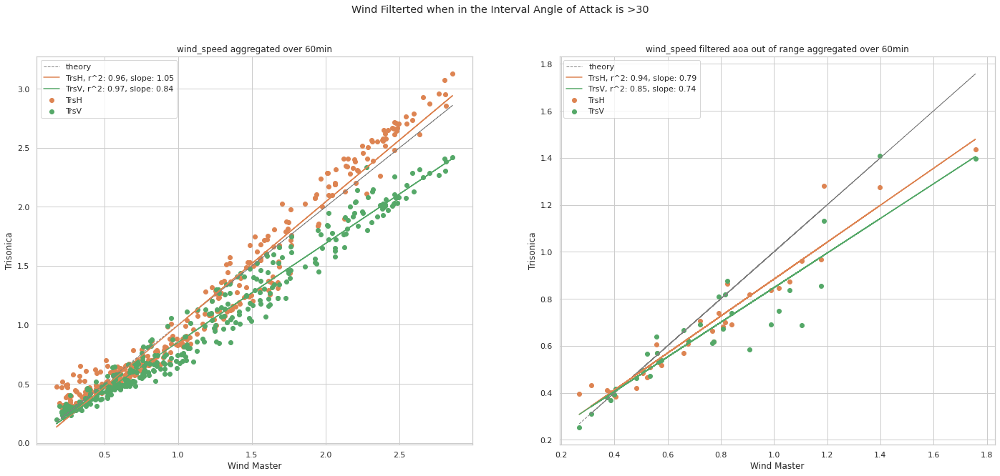

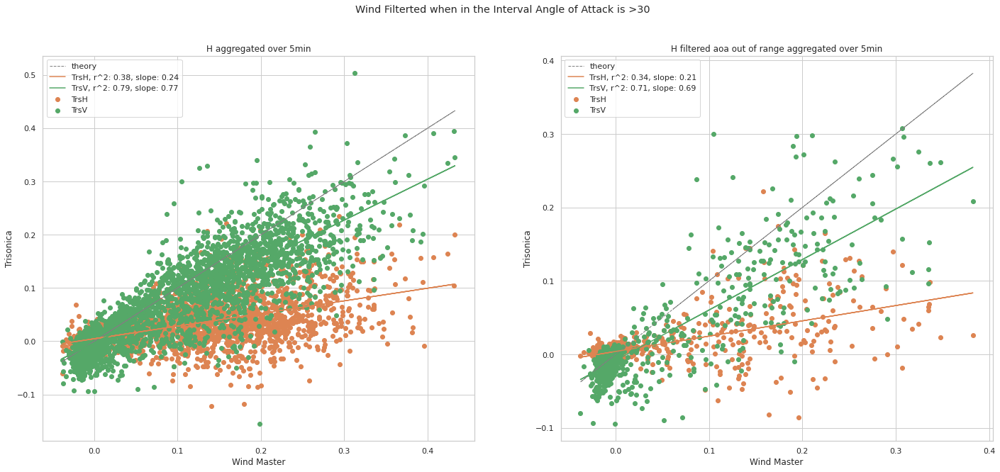

...

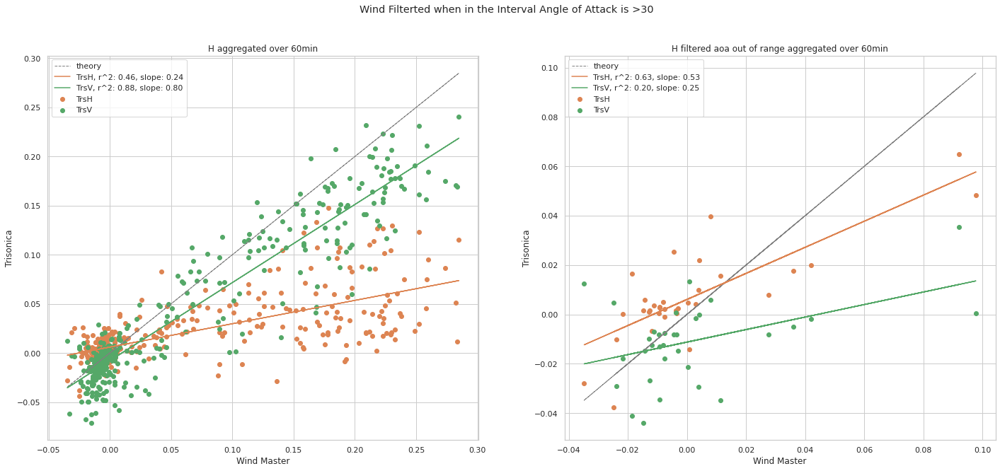

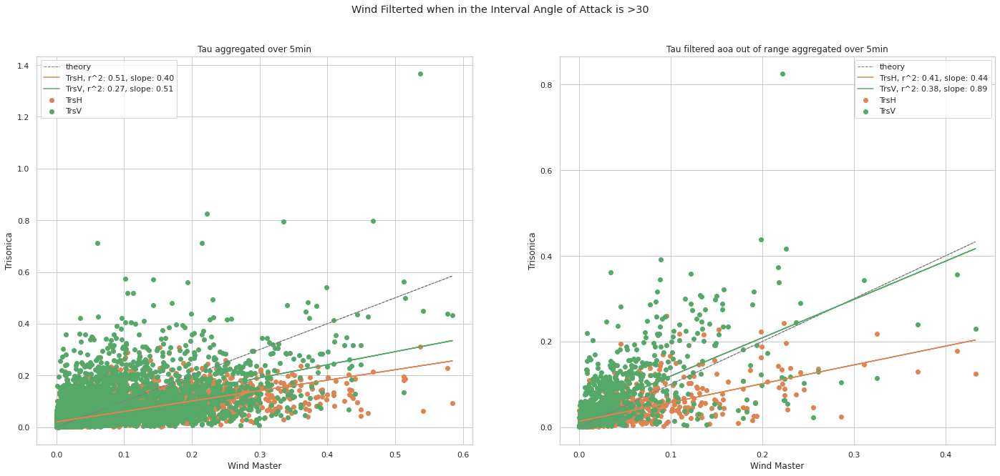

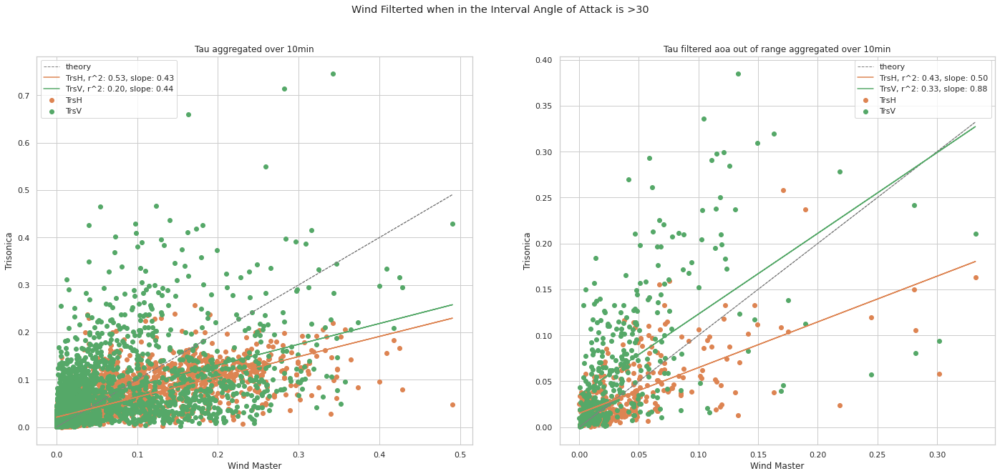

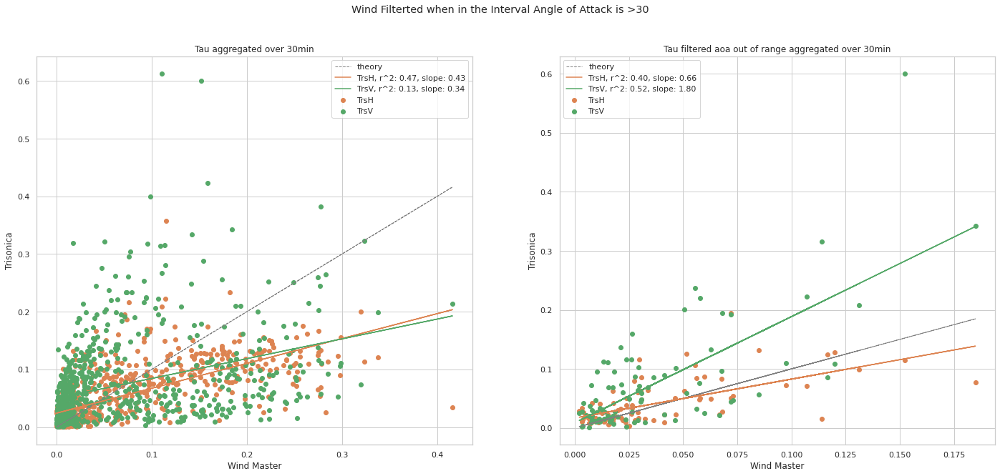

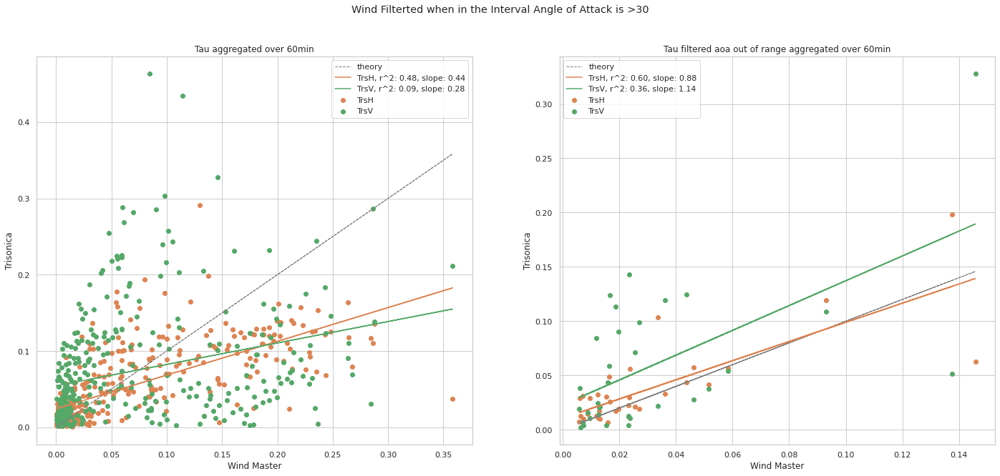

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for col, time in product(['wind_speed', 'H', 'Tau' ], ['5min', '10min', '30min']):
    axes = get_ax(1,2)
    plot_one_scatter(aggr_data[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[0])
    plot_one_scatter([df[not_good_aoa[time]] for df in aggr_data[time]], col, plot_info_all, title=f"filtered aoa out of range aggregated over {time}", ax=axes[1])
    plt.suptitle("Wind Filterted when in the Interval Angle of Attack is >30 for at least 25% of the time (Raw Fluxes)")

/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys


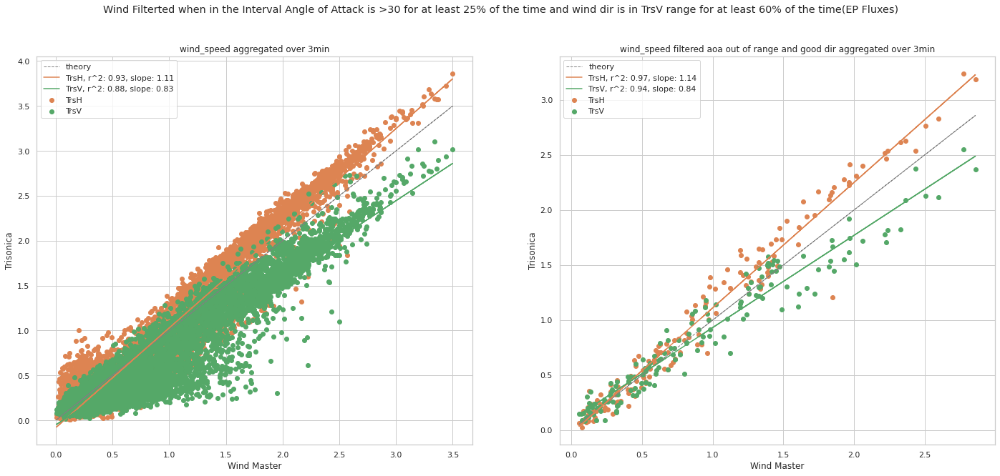

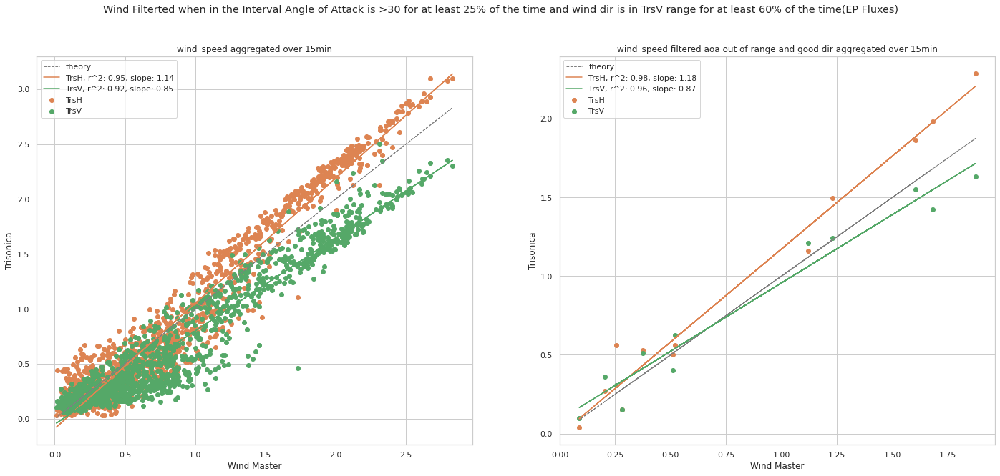

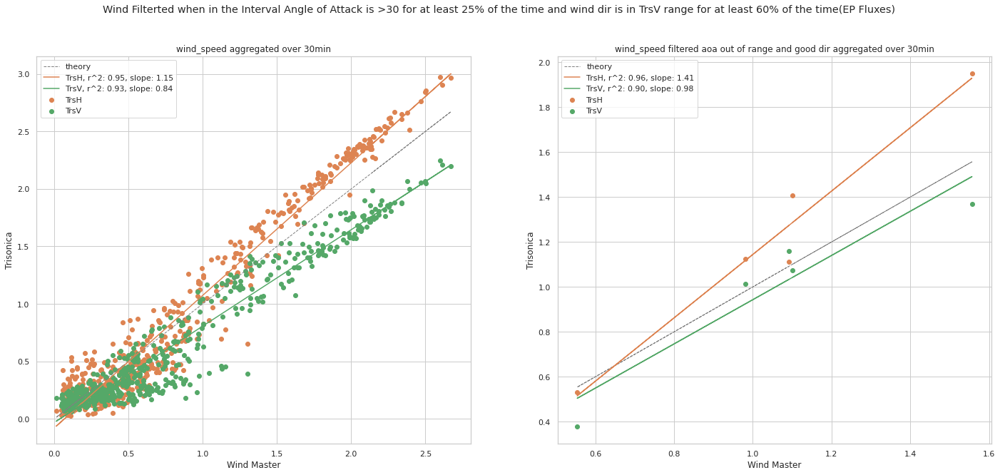

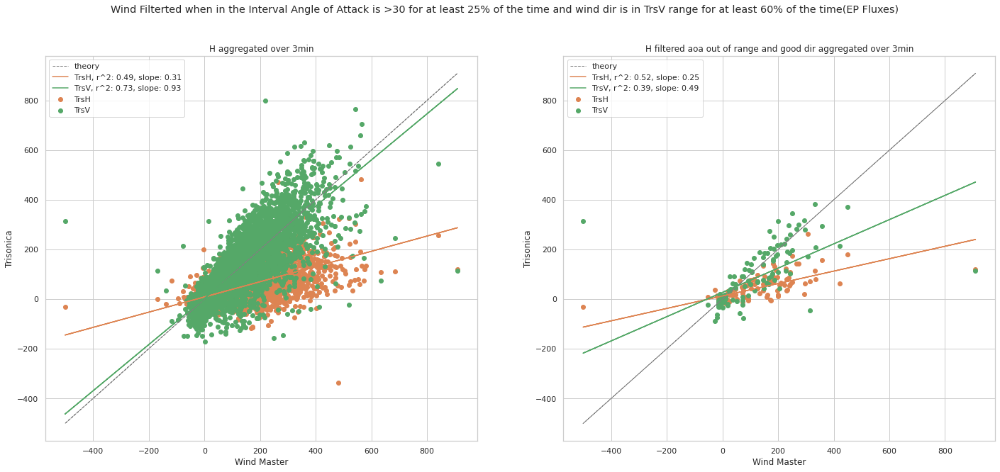

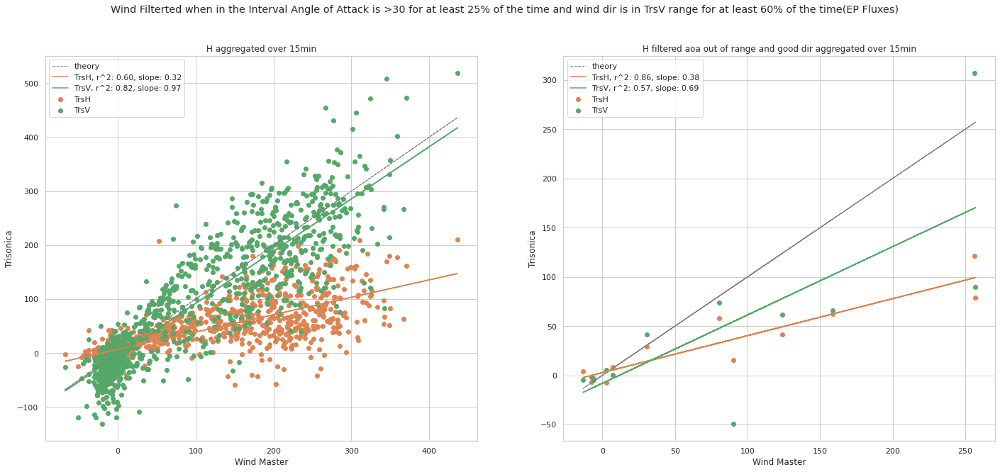

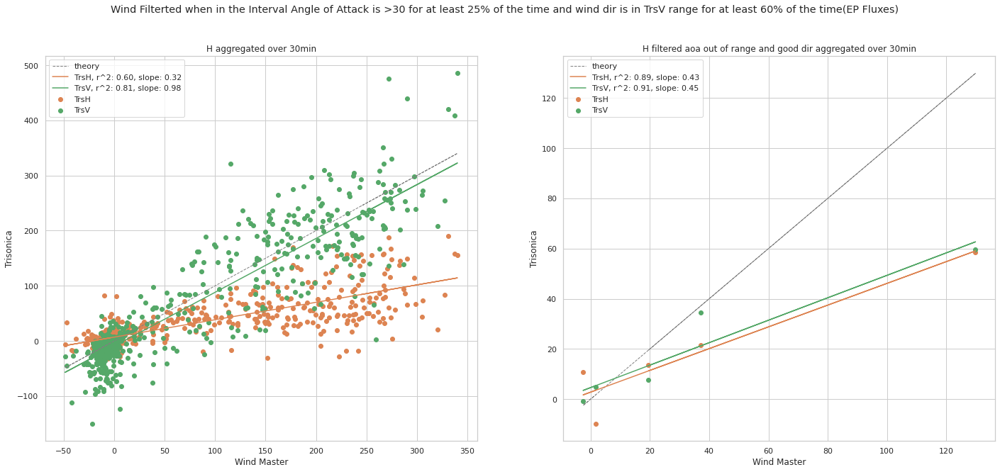

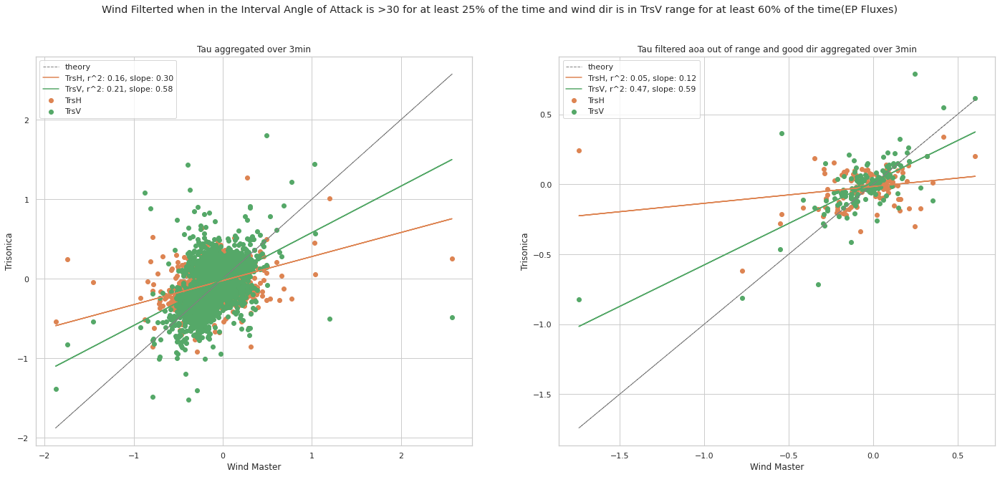

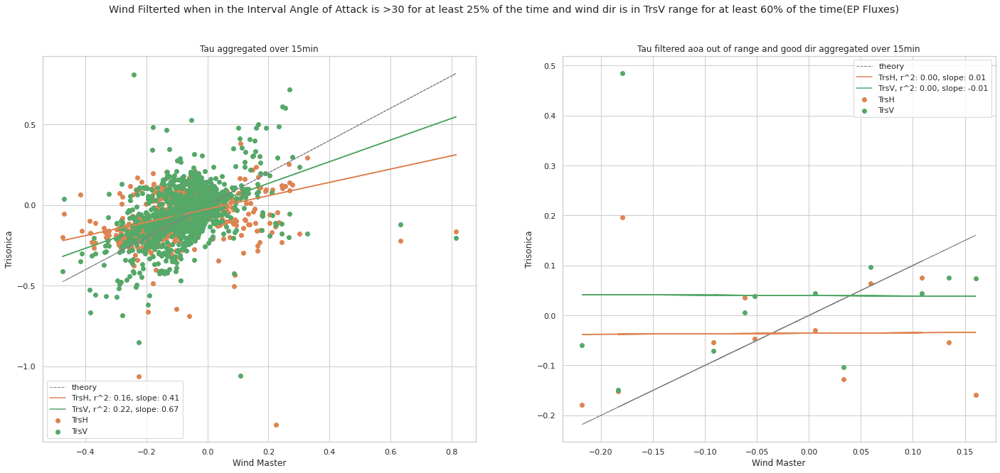

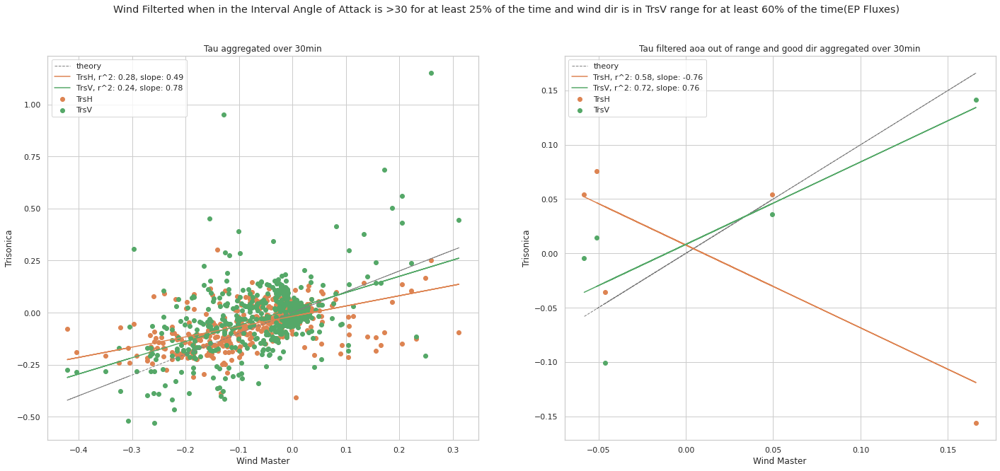

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for col, time in product(['wind_speed', 'H', 'Tau' ], ['3min', '15min', '30min']):
    axes = get_ax(1,2)
    plt.suptitle("Wind Filterted when in the Interval Angle of Attack is >30 for at least 25% of the time and wind dir is in TrsV range for at least 60% of the time(EP Fluxes)")
    
    plot_one_scatter(data_ep[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[0])
    filt_data = [df[:-1][not_good_aoa_and_dir[time][1:]] for df in data_ep[time]]
    if any([len(d) == 0 for d in filt_data]):
           print("Not enough data")
           continue
           
    plot_one_scatter(filt_data, col, plot_info_all, title=f"filtered aoa out of range and good dir aggregated over {time}", ax=axes[1])
    

## High frequency Filter of wind Dir - Fluxes

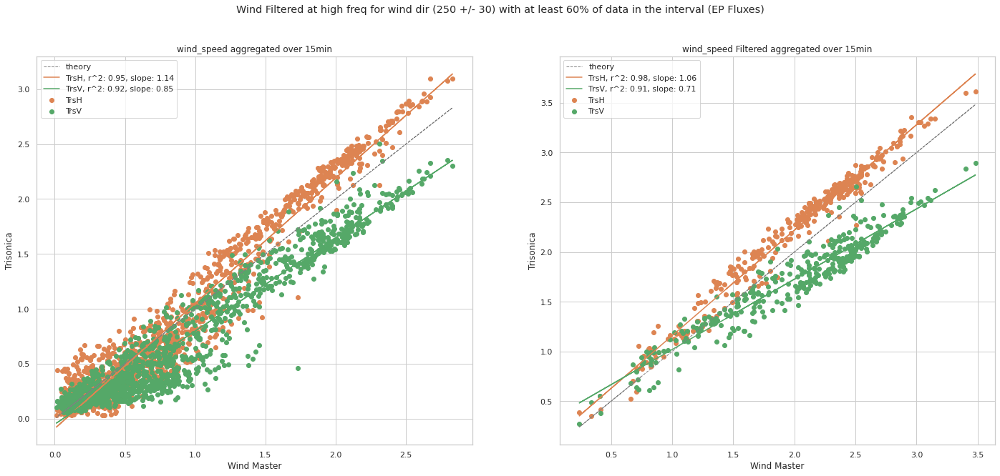

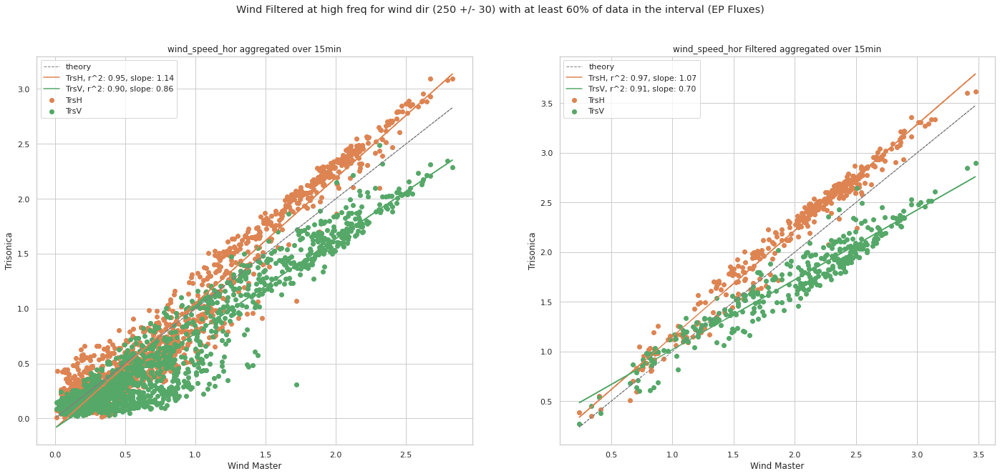

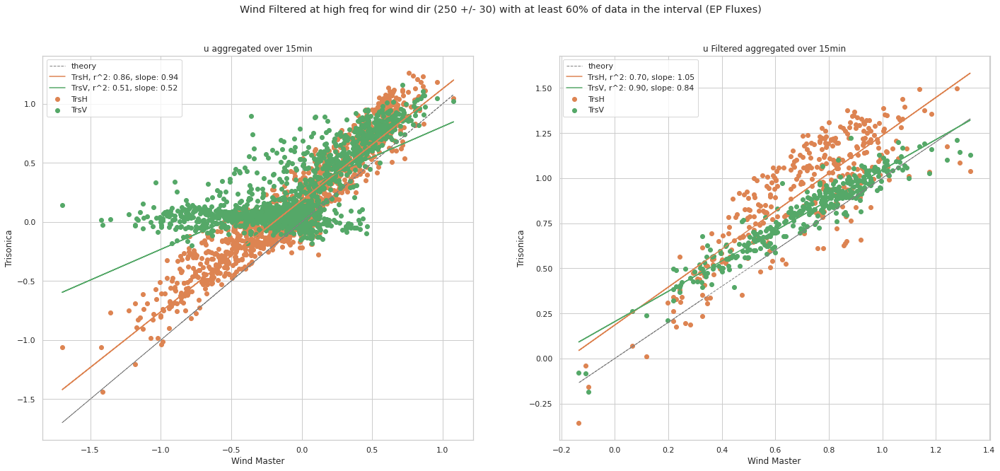

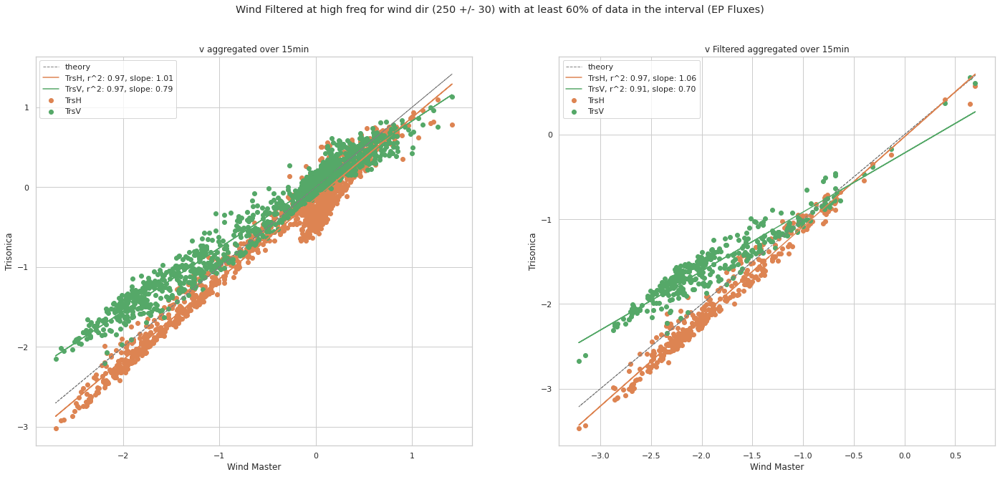

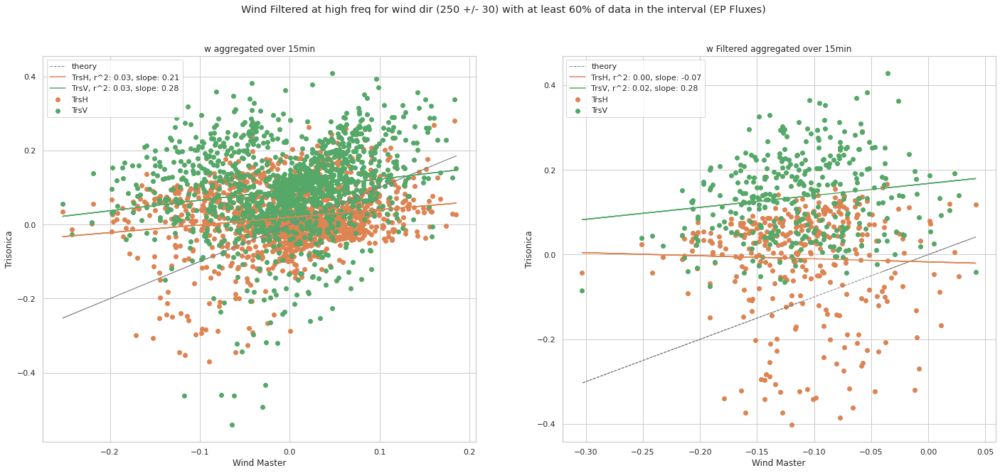

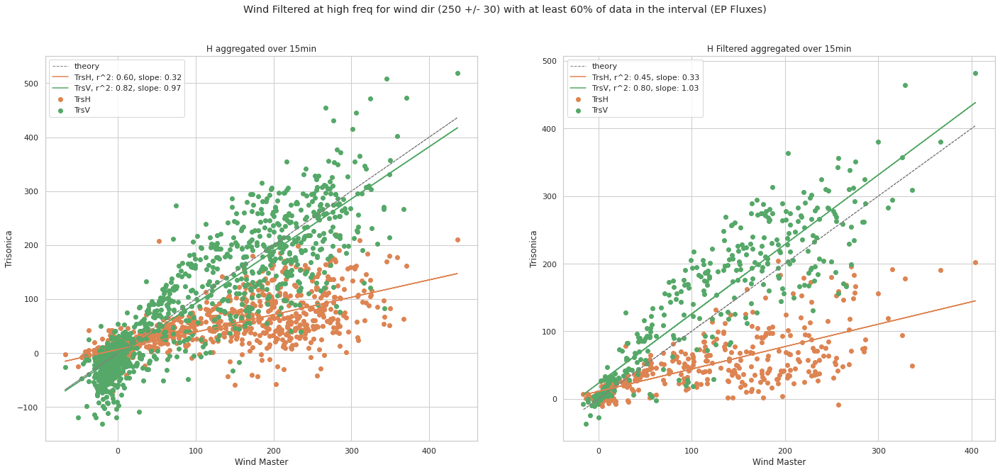

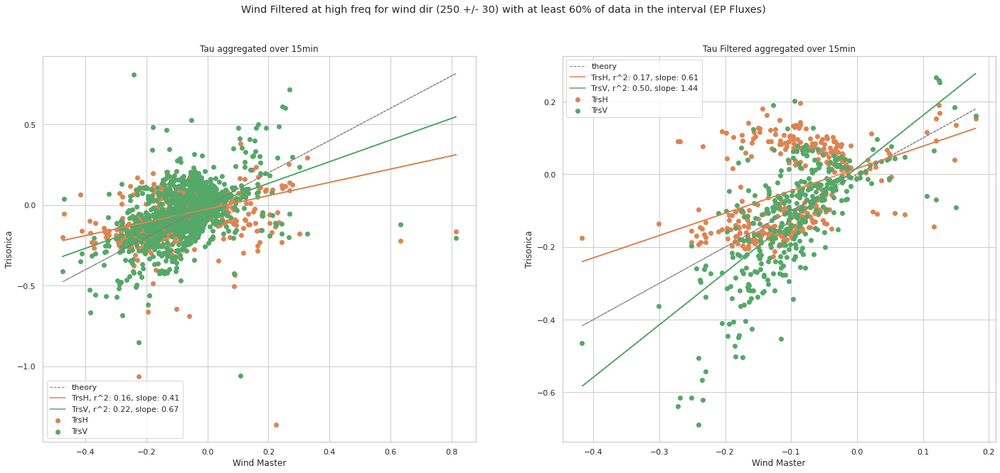

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for col, time in product(['wind_speed', 'wind_speed_hor', 'u', 'v', 'w', 'H', 'Tau' ], ['15min']):
    axes = get_ax(1,2)
    plt.suptitle("Wind Filtered at high freq for wind dir (250 +/- 30) with at least 60% of data in the interval (EP Fluxes)")
    plot_one_scatter(data_ep[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[0])
    plot_one_scatter(ep_filt_dir[time], col, plot_info_all, title=f"Filtered aggregated over {time}", ax=axes[1])

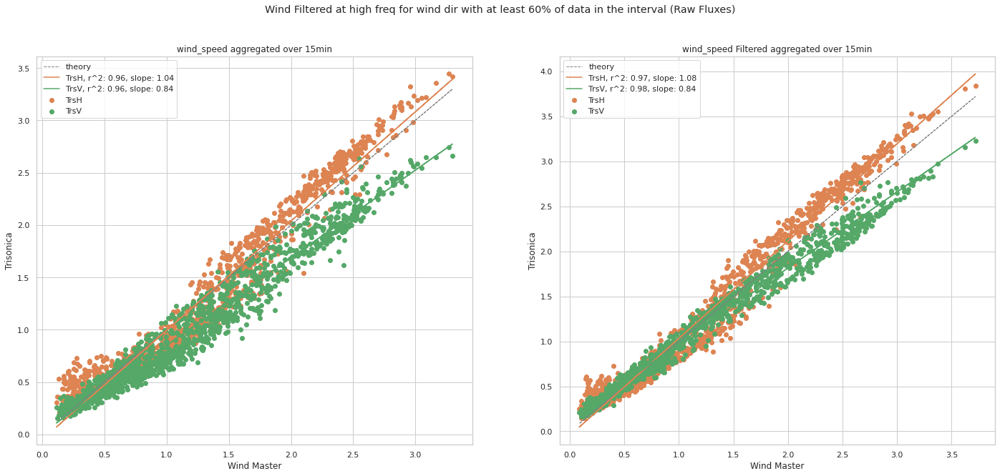

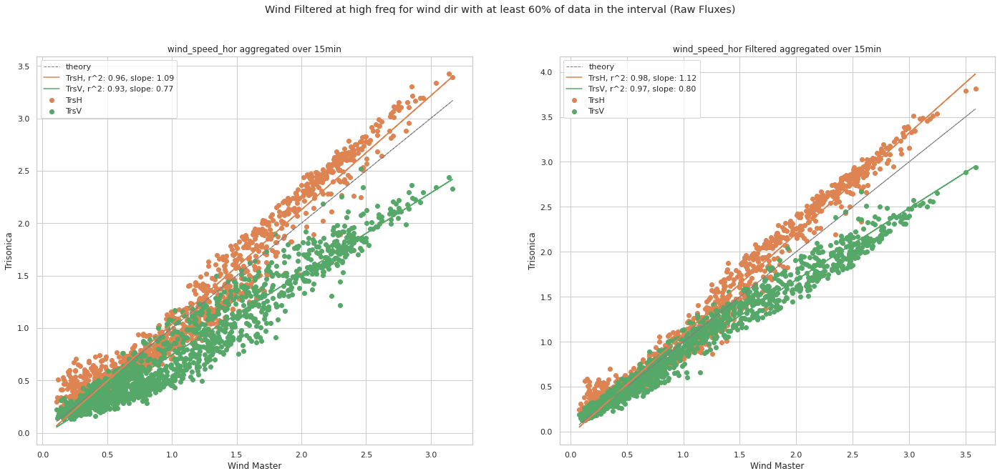

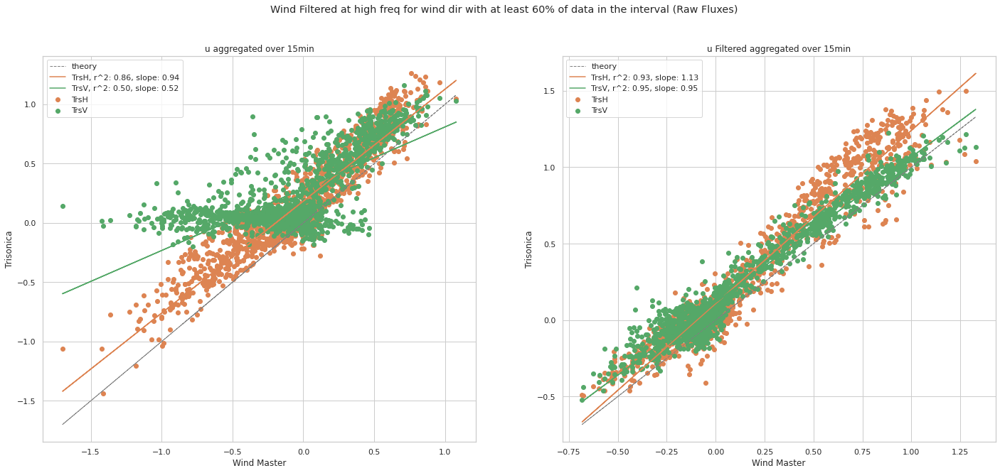

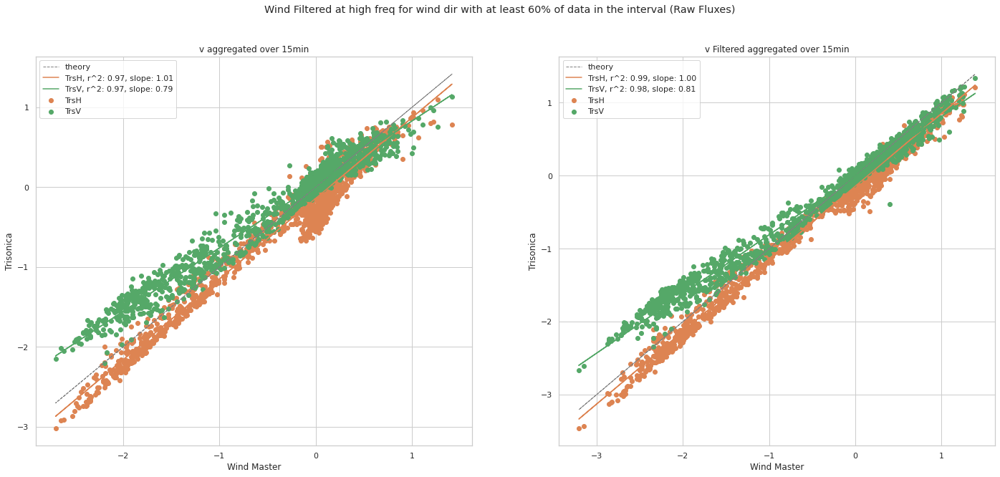

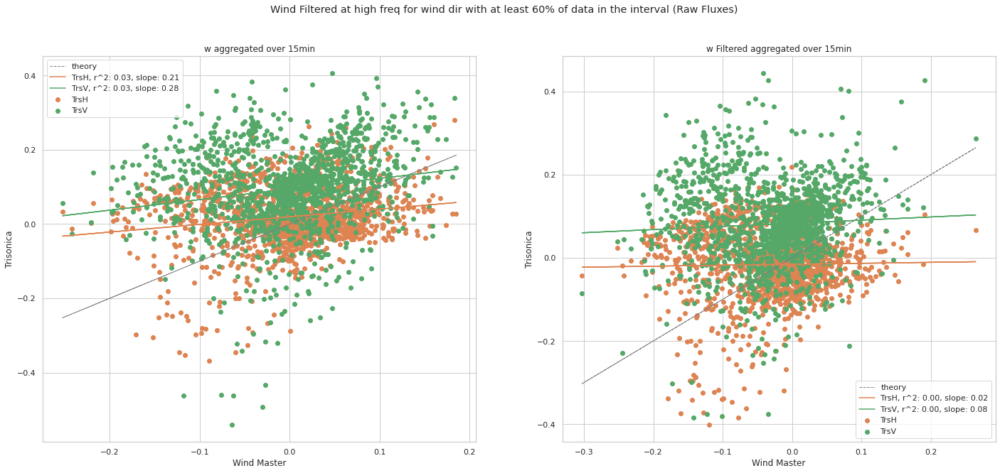

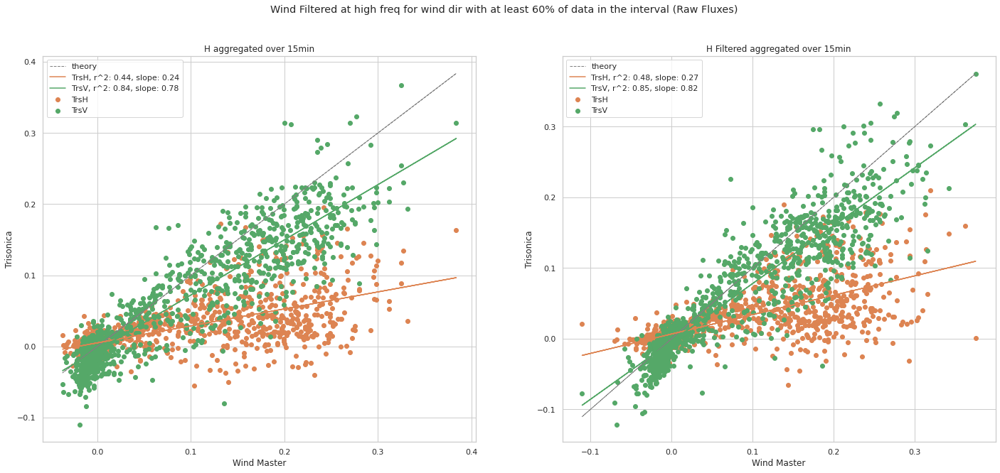

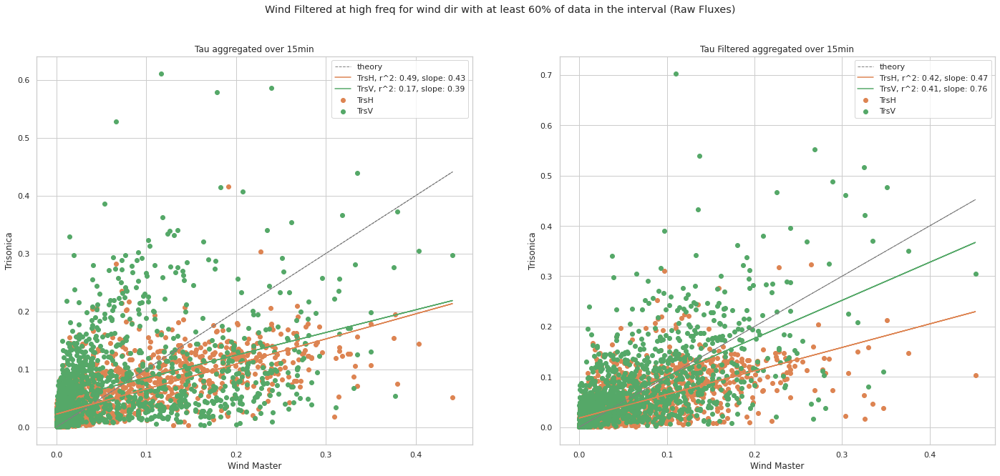

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for col, time in product(['wind_speed', 'wind_speed_hor', 'u', 'v', 'w', 'H', 'Tau' ], ['15min']):
    axes = get_ax(1,2)
    plt.suptitle("Wind Filtered at high freq for wind dir with at least 60% of data in the interval (Raw Fluxes)")
    plot_one_scatter(aggr_data[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[0])
    plot_one_scatter(aggr_data_dir_filt[time], col, plot_info_all, title=f"Filtered aggregated over {time}", ax=axes[1])

### Strict Filter (250 +/- 20) 

In [ ]:
dir_filt_strict = filter_by_wind_dir(wm1, 250, 20)

In [ ]:
aggr_data_dir_filt_strict = {time: [add_raw_fluxes(df[dir_filt_strict], time) for df in [wm1, TrsH, TrsV]] for time in ['5min', '15min', '30min']}

/home/simone/anaconda3/lib/python3.7/site-packages/pandas/core/nanops.py:1286: RuntimeWarning: Degrees of freedom <= 0 for slice
  return np.cov(a, b)[0, 1]
/home/simone/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


/home/simone/Documents/Tesi/trisonica-anemometer-comparison/wind_tools.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  def get_ax(nrows=1, ncols=1, **kwargs): return plt.subplots(nrows, ncols, **kwargs)[1]


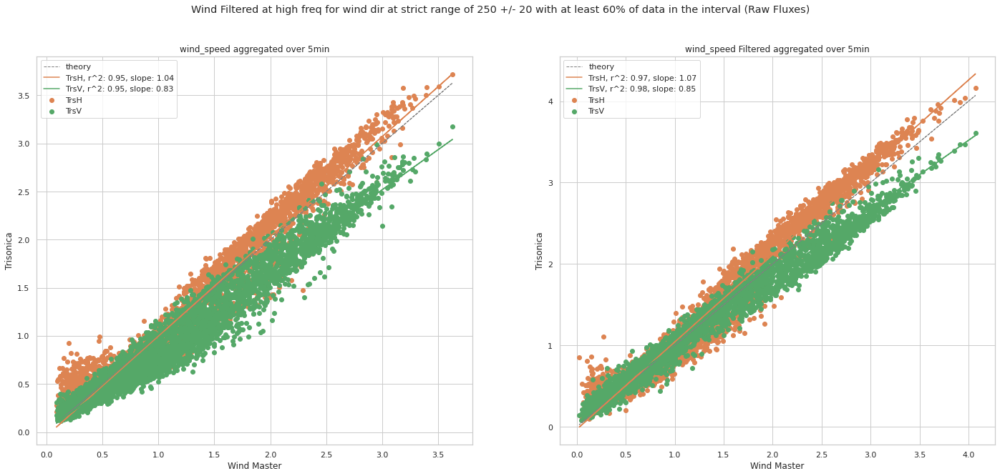

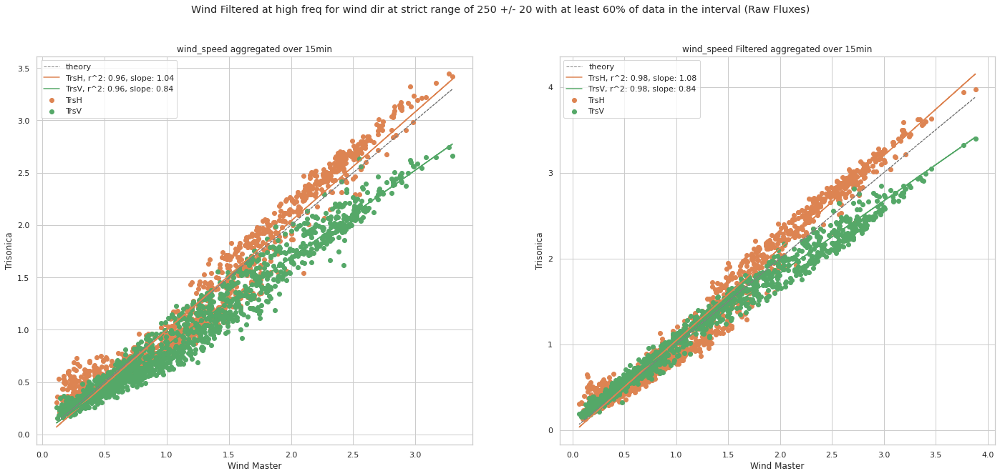

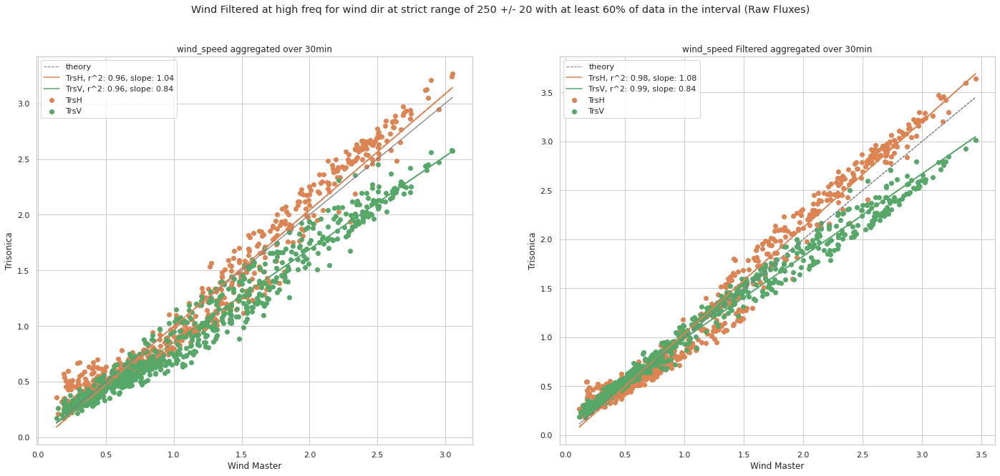

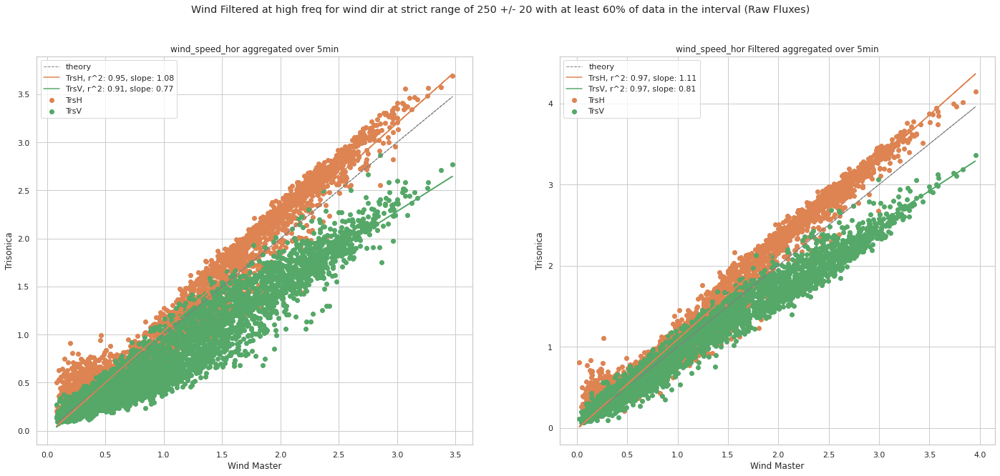

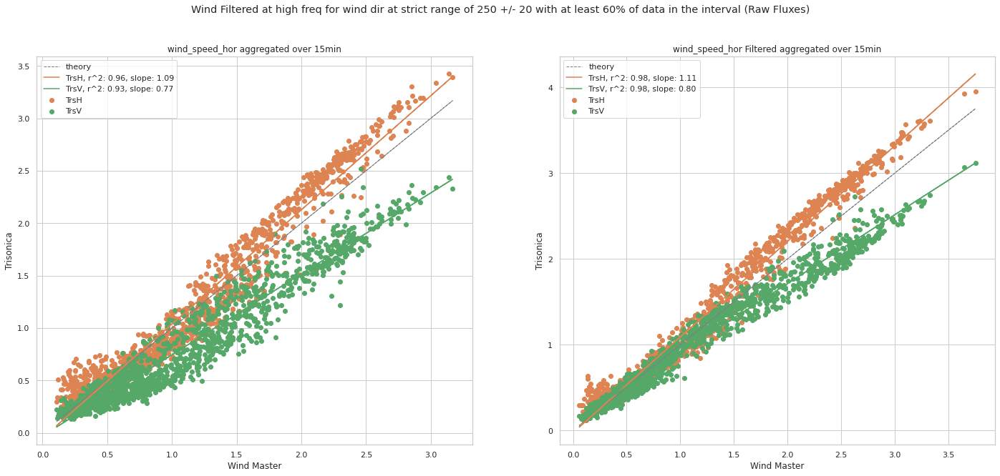

...

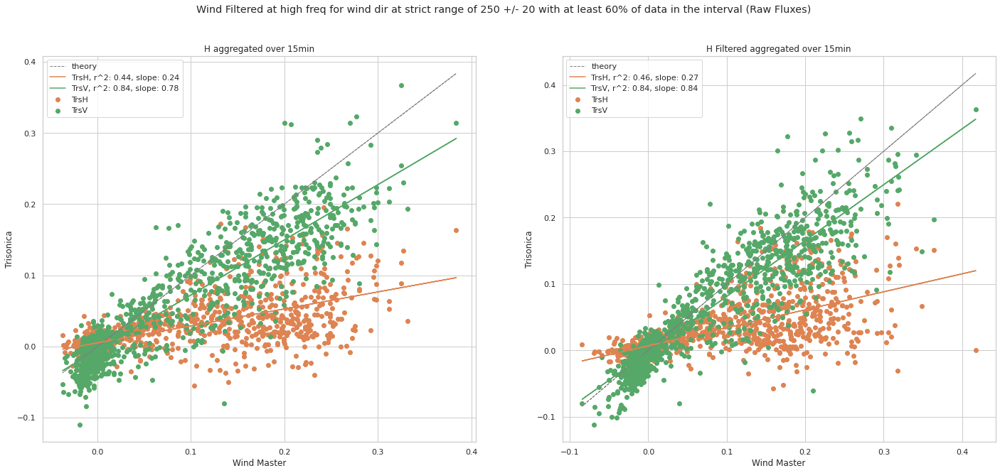

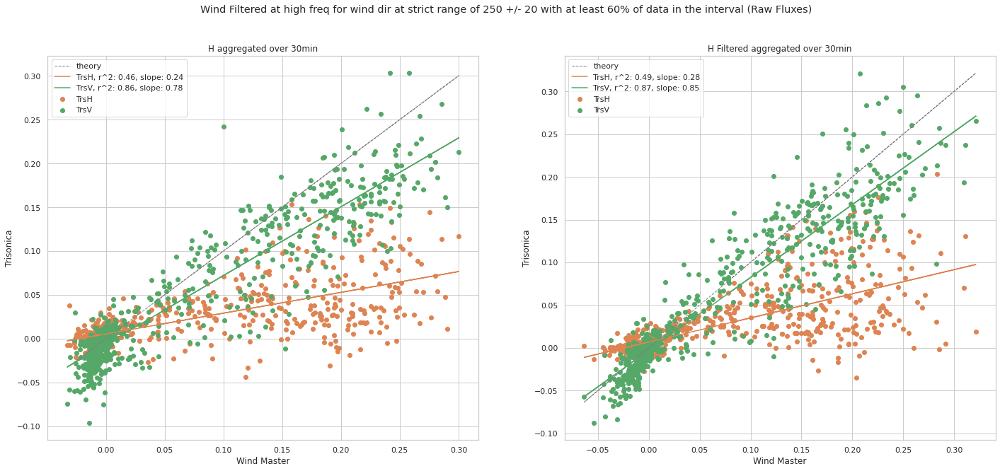

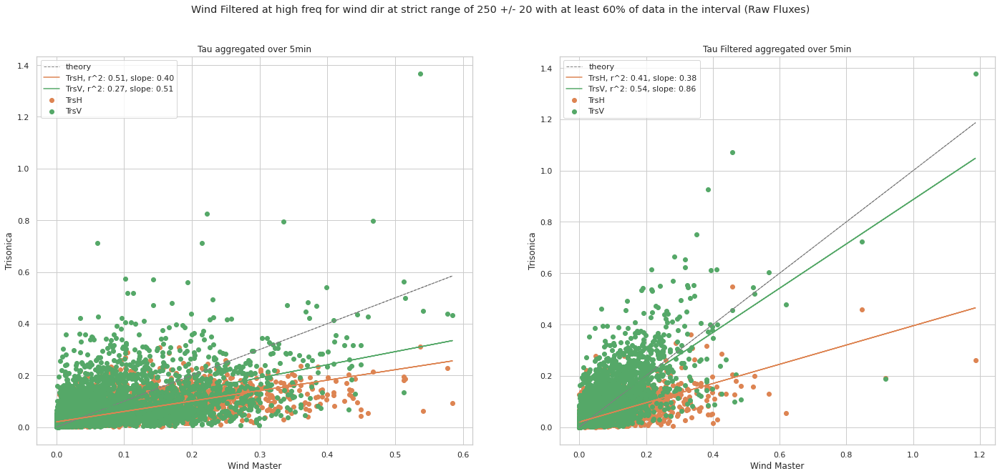

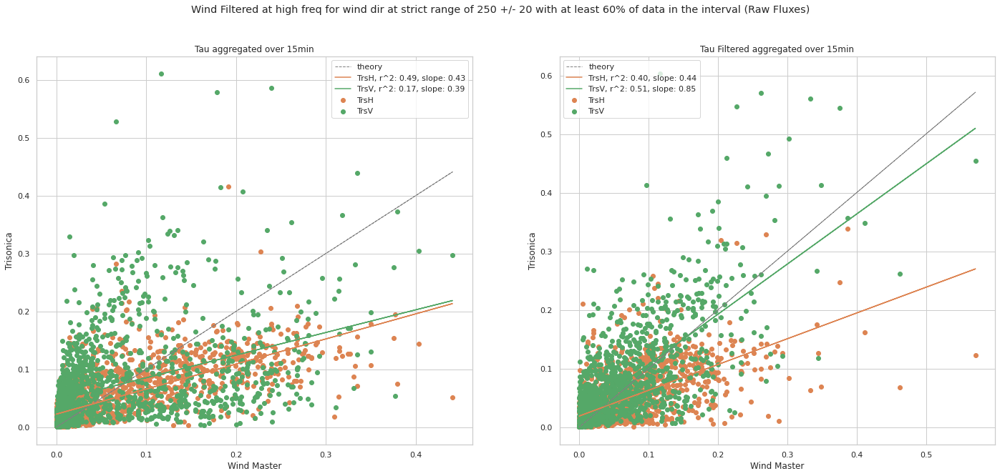

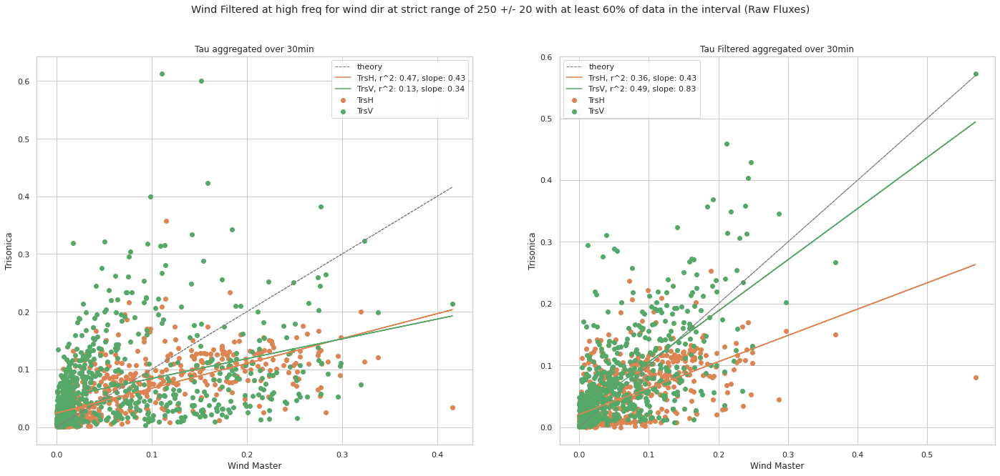

In [ ]:
matplotlib.rcParams['figure.figsize'] = (24,10)
for col, time in product(['wind_speed', 'wind_speed_hor', 'u', 'v', 'w', 'H', 'Tau' ], ['5min', '15min', '30min']):
    axes = get_ax(1,2)
    plt.suptitle("Wind Filtered at high freq for wind dir at strict range of 250 +/- 20 with at least 60% of data in the interval (Raw Fluxes)")
    plot_one_scatter(aggr_data[time], col, plot_info_all, title=f"aggregated over {time}", ax=axes[0])
    plot_one_scatter(aggr_data_dir_filt_strict[time], col, plot_info_all, title=f"Filtered aggregated over {time}", ax=axes[1])

## Filter by Wind Dir

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


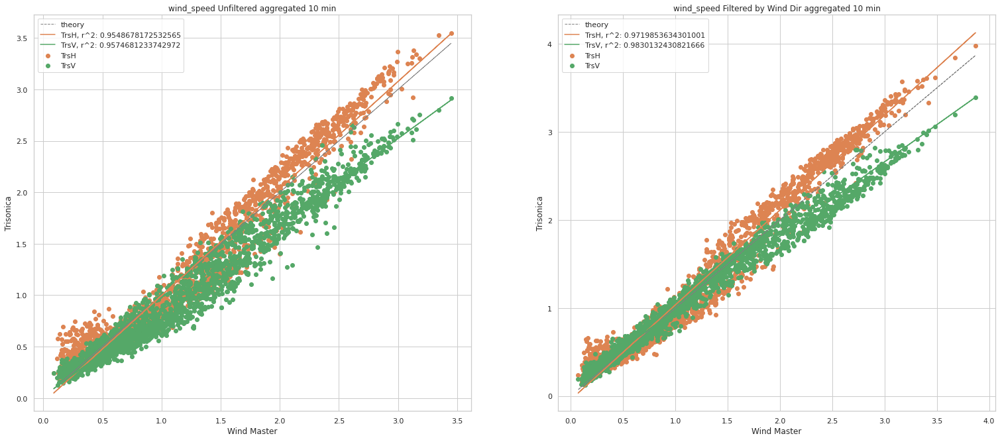

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='wind_speed', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_dir_10m, col='wind_speed', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 10 min", ax=axes[1])

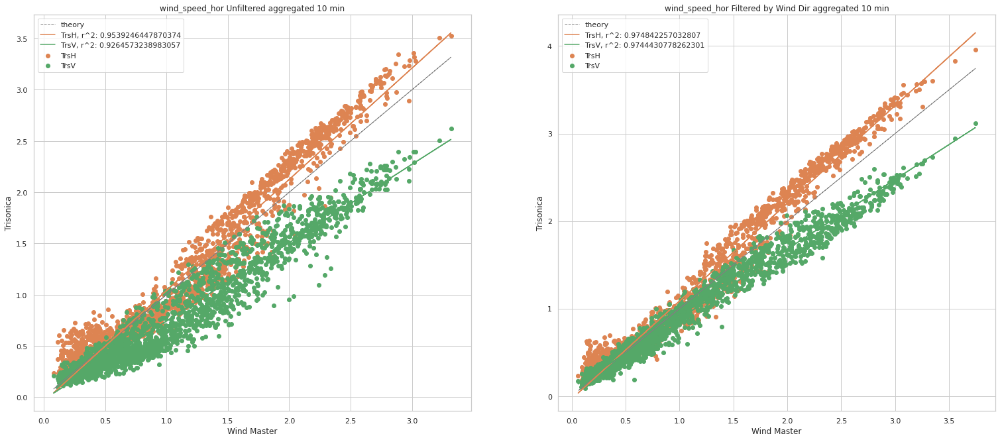

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='wind_speed_hor', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_dir_10m, col='wind_speed_hor', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 10 min", ax=axes[1])

##### u TrsV

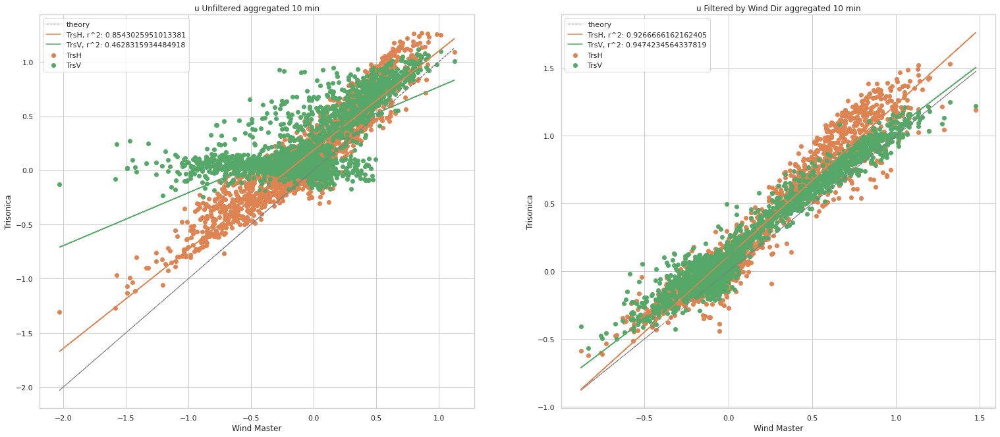

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='u', plot_info=plot_info_all, title="unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_dir_10m, col='u', plot_info=plot_info_all, title="filtered by Wind Dir aggregated 10 min", ax=axes[1])

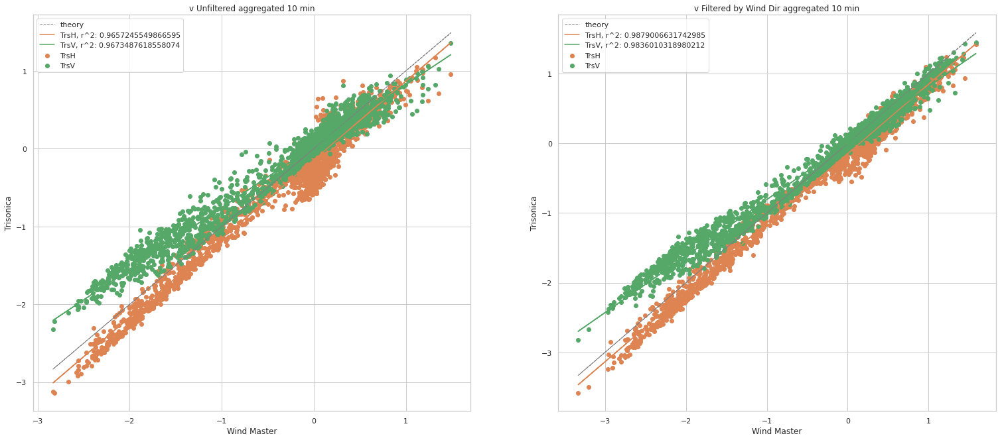

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='v', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_dir_10m, col='v', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 10 min", ax=axes[1])

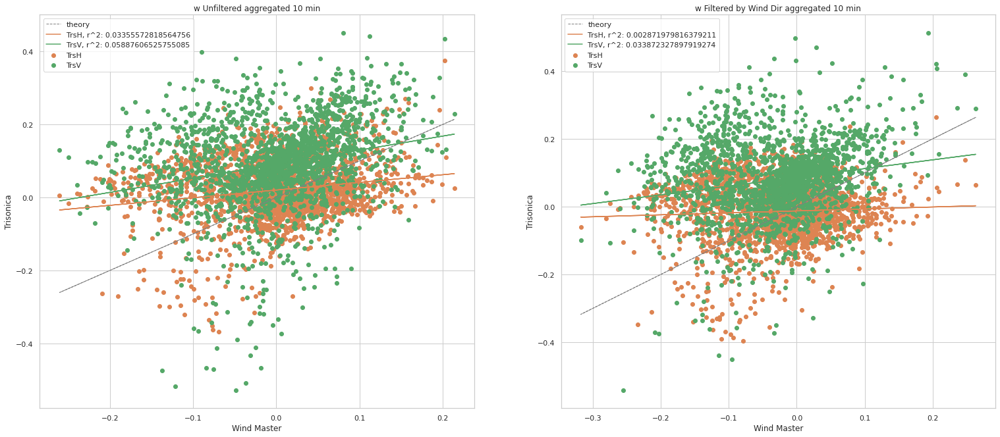

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='w', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_dir_10m, col='w', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 10 min", ax=axes[1])

## Filter by AoA 

In [ ]:
aoa_filt.sum() / aoa_filt.count()

0.8218786491045611

AoA is for more than 80% of the time in the right range, so filtering should not change a lot

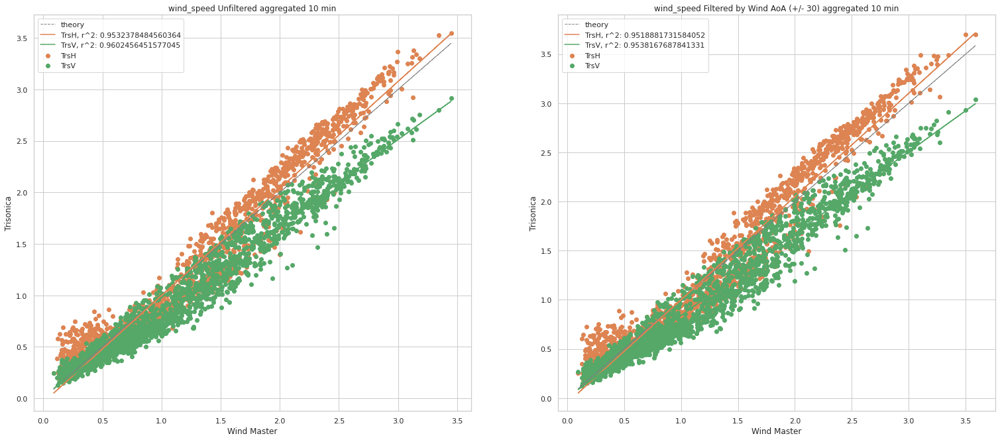

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='wind_speed', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_10m, col='wind_speed', plot_info=plot_info_all, title="Filtered by Wind AoA (+/- 30) aggregated 10 min", ax=axes[1])

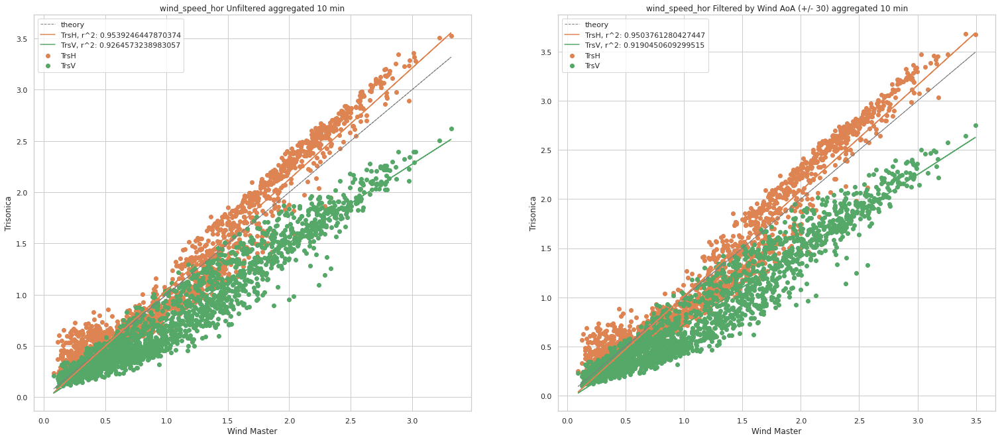

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='wind_speed_hor', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_10m, col='wind_speed_hor', plot_info=plot_info_all, title="Filtered by Wind AoA (+/- 30) aggregated 10 min", ax=axes[1])

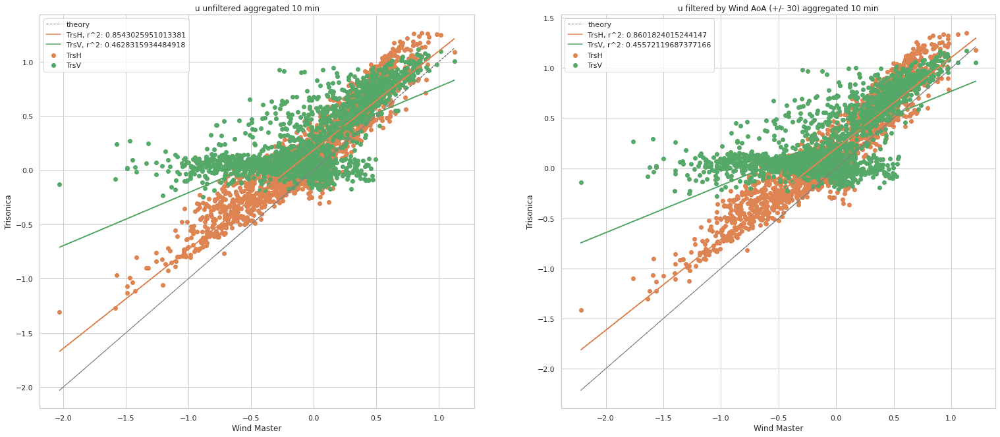

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='u', plot_info=plot_info_all, title="unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_10m, col='u', plot_info=plot_info_all, title="filtered by Wind AoA (+/- 30) aggregated 10 min", ax=axes[1])

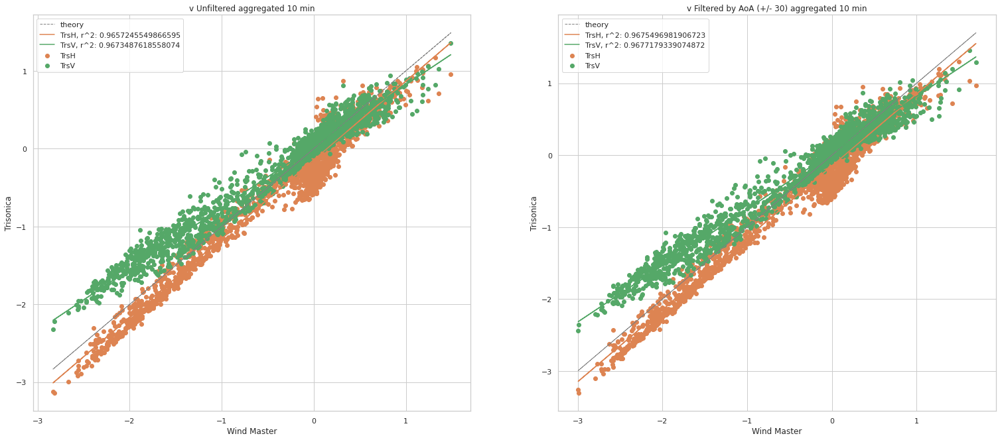

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='v', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_10m, col='v', plot_info=plot_info_all, title="Filtered by AoA (+/- 30) aggregated 10 min", ax=axes[1])

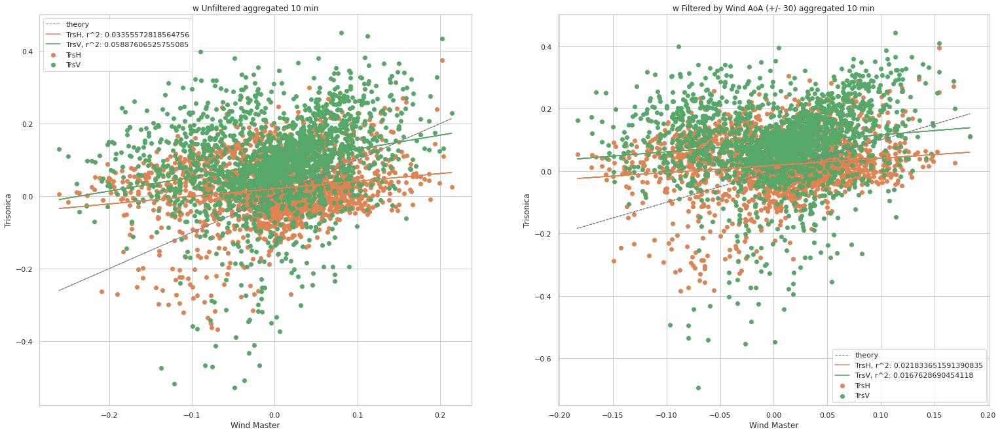

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='w', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_10m, col='w', plot_info=plot_info_all, title="Filtered by Wind AoA (+/- 30) aggregated 10 min", ax=axes[1])

## Filter by Wind Dir AND AoA

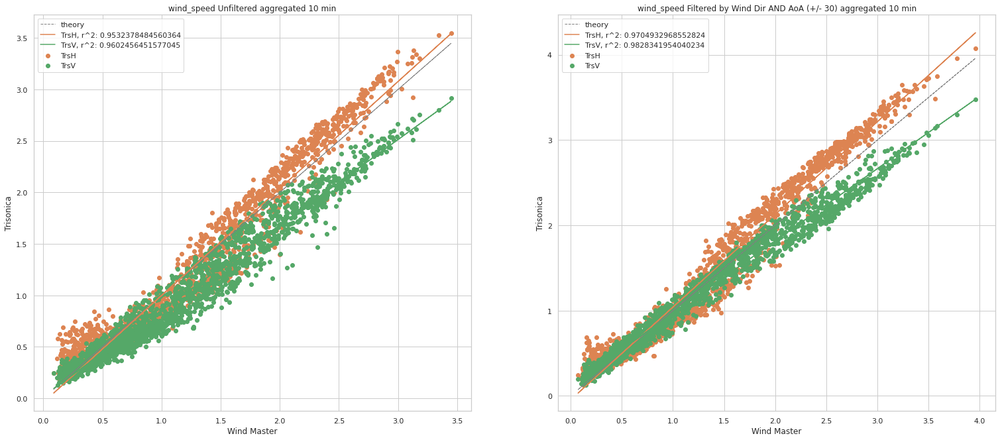

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='wind_speed', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_and_dir_10m, col='wind_speed', plot_info=plot_info_all, title="Filtered by Wind Dir AND AoA (+/- 30) aggregated 10 min", ax=axes[1])

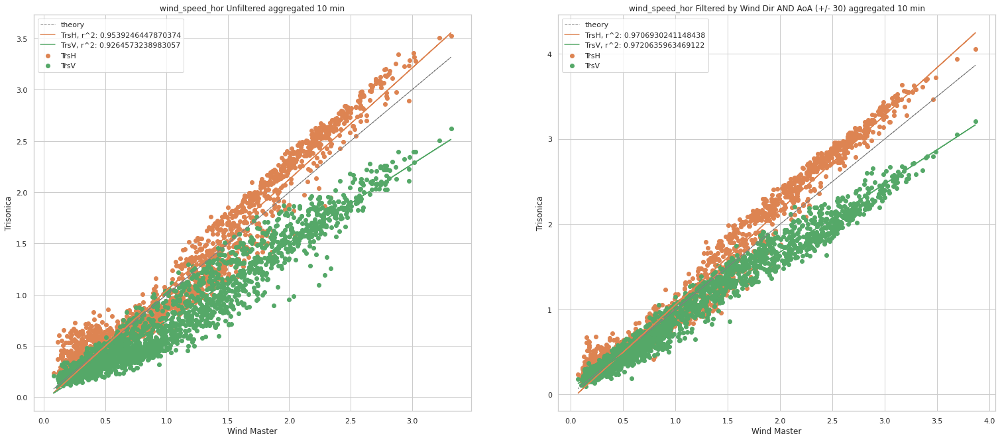

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='wind_speed_hor', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_and_dir_10m, col='wind_speed_hor', plot_info=plot_info_all, title="Filtered by Wind Dir AND AoA (+/- 30) aggregated 10 min", ax=axes[1])

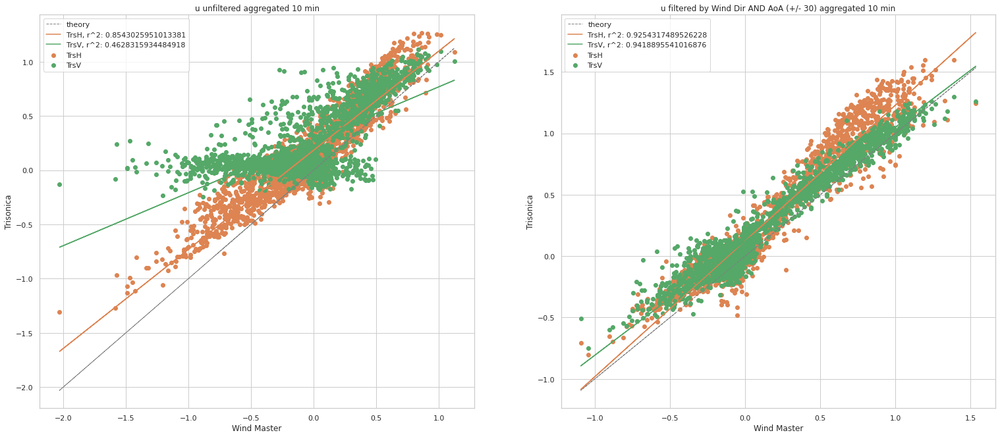

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='u', plot_info=plot_info_all, title="unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_and_dir_10m, col='u', plot_info=plot_info_all, title="filtered by Wind Dir AND AoA (+/- 30) aggregated 10 min", ax=axes[1])

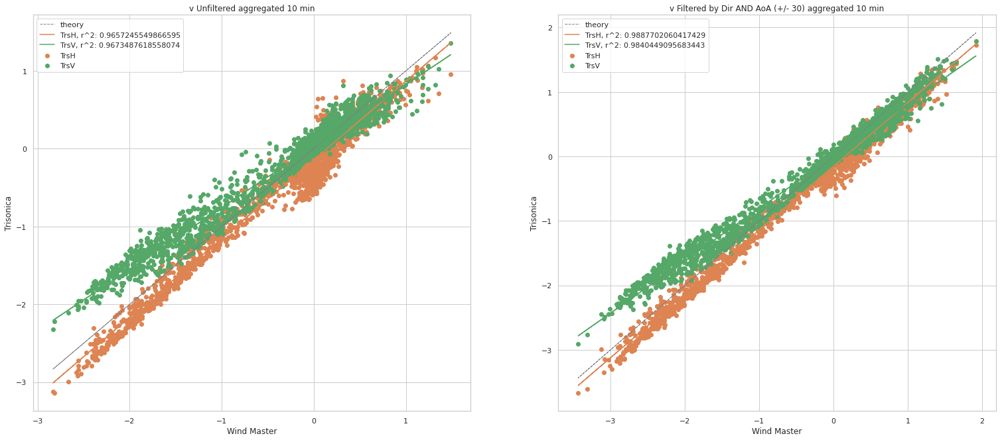

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='v', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_and_dir_10m, col='v', plot_info=plot_info_all, title="Filtered by Dir AND AoA (+/- 30) aggregated 10 min", ax=axes[1])

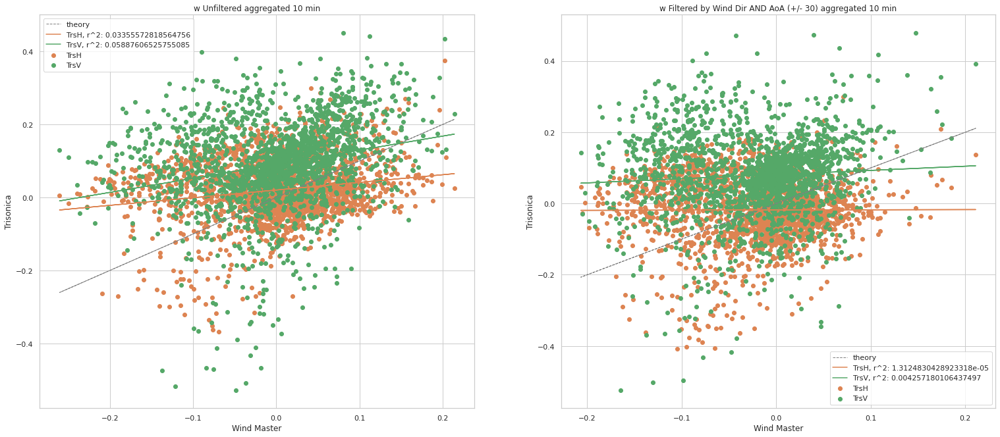

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(unf_10m, col='w', plot_info=plot_info_all, title="Unfiltered aggregated 10 min", ax=axes[0])
plot_one_scatter(filt_aoa_and_dir_10m, col='w', plot_info=plot_info_all, title="Filtered by Wind Dir AND AoA (+/- 30) aggregated 10 min", ax=axes[1])

## Fluxes 

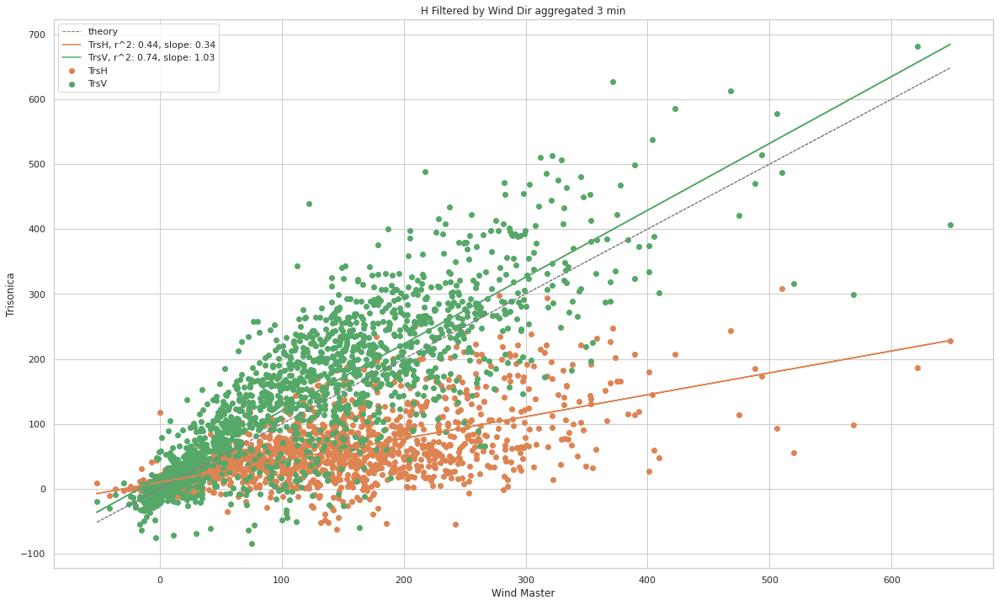

In [ ]:
plot_one_scatter(filt_dir_ep, col='H', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 3 min")

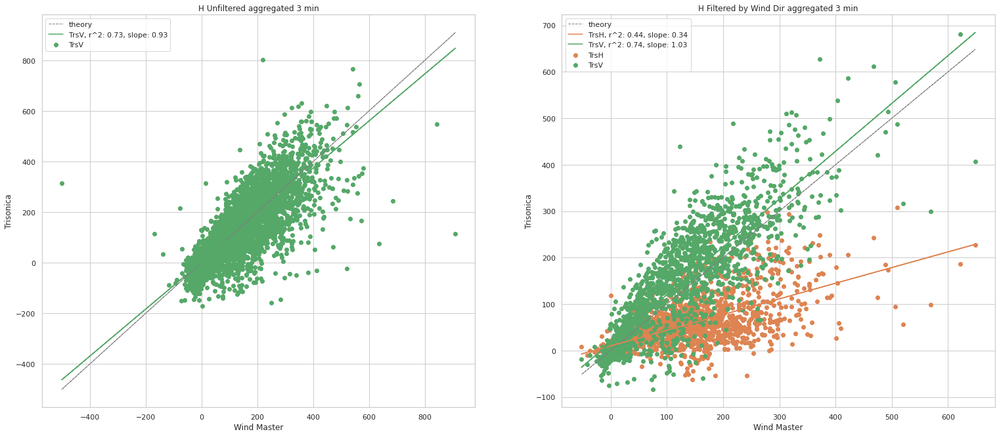

In [ ]:
axes=get_ax(1,2, figsize=(26,11)) 
plot_one_scatter(ep_3m, col='H', plot_info=plot_info_m7, title="Unfiltered aggregated 3 min", ax=axes[0])
plot_one_scatter(filt_dir_ep, col='H', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 3 min", ax=axes[1])

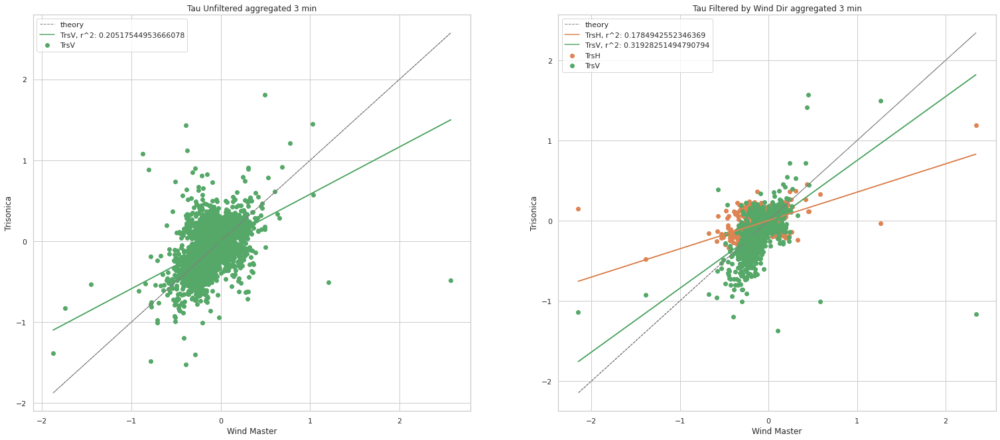

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(ep_3m, col='Tau', plot_info=plot_info_m7, title="Unfiltered aggregated 3 min", ax=axes[0])
plot_one_scatter(filt_dir_ep, col='Tau', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 3 min", ax=axes[1])

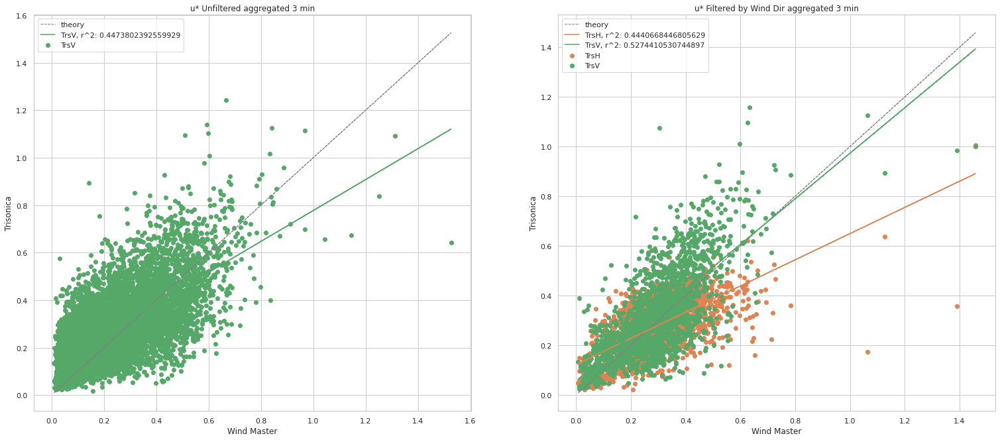

In [ ]:
axes=get_ax(1,2, figsize=(26,11))
plot_one_scatter(ep_3m, col='u*', plot_info=plot_info_m7, title="Unfiltered aggregated 3 min", ax=axes[0])
plot_one_scatter(filt_dir_ep, col='u*', plot_info=plot_info_all, title="Filtered by Wind Dir aggregated 3 min", ax=axes[1])

my fluxes

In [ ]:
def add_H_flux(df, interval):
    H =[]
    res = df.resample(interval)
    for i, g in res:
        H.append(g.w.cov(g.t))
    ret = res.mean()
    ret['H'] = H
    return ret

In [ ]:
def add_tau_flux(df, interval):
    tau =[]
    res = df.resample(interval)
    for i, g in res:
        tau.append(g.w.cov(g.t))
    ret = res.mean()
    ret['Tau'] = tau
    return ret

In [ ]:
add_H_flux(test, '30min')['H']

2020-08-24 00:00:00   -0.015980
2020-08-24 00:30:00   -0.023333
2020-08-24 01:00:00    0.009023
2020-08-24 01:30:00   -0.005173
2020-08-24 02:00:00   -0.008614
2020-08-24 02:30:00   -0.009192
2020-08-24 03:00:00   -0.014506
2020-08-24 03:30:00   -0.013334
2020-08-24 04:00:00   -0.032847
2020-08-24 04:30:00   -0.006386
2020-08-24 05:00:00   -0.014526
2020-08-24 05:30:00   -0.011787
2020-08-24 06:00:00   -0.010808
2020-08-24 06:30:00   -0.012472
2020-08-24 07:00:00   -0.001746
2020-08-24 07:30:00   -0.016957
2020-08-24 08:00:00    0.003268
2020-08-24 08:30:00    0.043140
2020-08-24 09:00:00    0.087147
2020-08-24 09:30:00    0.114311
2020-08-24 10:00:00    0.087477
2020-08-24 10:30:00    0.163378
2020-08-24 11:00:00    0.129187
2020-08-24 11:30:00    0.133583
2020-08-24 12:00:00    0.242328
2020-08-24 12:30:00    0.268420
2020-08-24 13:00:00    0.100377
2020-08-24 13:30:00    0.228585
2020-08-24 14:00:00    0.300258
2020-08-24 14:30:00    0.285490
2020-08-24 15:00:00    0.257683
2020-08-

In [ ]:
test.w.cov(test.t)

-0.11095625836472037

In [ ]:
test = wm1.loc['2020-08-24 00:00':'2020-08-24 23:59']

In [ ]:
test

,u,v,w,t,wind_dir,wind_speed,angle_attack,wind_speed_hor
2020-08-24 05:00:00.000,-1.03,0.46,0.33,22.10,24.065632,1.175330,16.306302,1.128051
2020-08-24 05:00:00.100,-0.87,0.55,0.16,22.07,32.300416,1.041633,8.835895,1.029272
2020-08-24 05:00:00.200,-0.84,0.61,0.13,22.09,35.986796,1.046231,7.137764,1.038123
2020-08-24 05:00:00.300,-0.82,0.62,0.14,22.09,37.092837,1.037497,7.755159,1.028008
2020-08-24 05:00:00.400,-0.76,0.51,0.15,22.09,33.863691,0.927470,9.307347,0.915260
...,...,...,...,...,...,...,...,...
2020-08-24 00:29:59.500,-1.20,0.24,0.24,24.50,11.309932,1.247077,11.095803,1.223765
2020-08-24 00:29:59.600,-1.09,0.24,0.25,24.52,12.417446,1.143766,12.625422,1.116109
2020-08-24 00:29:59.700,-1.10,0.14,0.20,24.56,7.253195,1.126765,10.224132,1.108873
2020-08-24 00:29:59.800,-1.10,0.20,0.22,24.50,10.304846,1.139474,11.132095,1.118034


In [ ]:
def first(x): print(x[0])

## Test

(array([9.66183575e-04, 3.86473430e-03, 1.83574879e-02, 5.41062802e-02,
        1.47826087e-01, 3.28985507e-01, 5.47342995e-01, 8.36714976e-01,
        9.57487923e-01, 1.00000000e+00]),
 array([0.47633333, 0.52865   , 0.58096667, 0.63328333, 0.6856    ,
        0.73791667, 0.79023333, 0.84255   , 0.89486667, 0.94718333,
        0.9995    ]),
 <BarContainer object of 10 artists>)

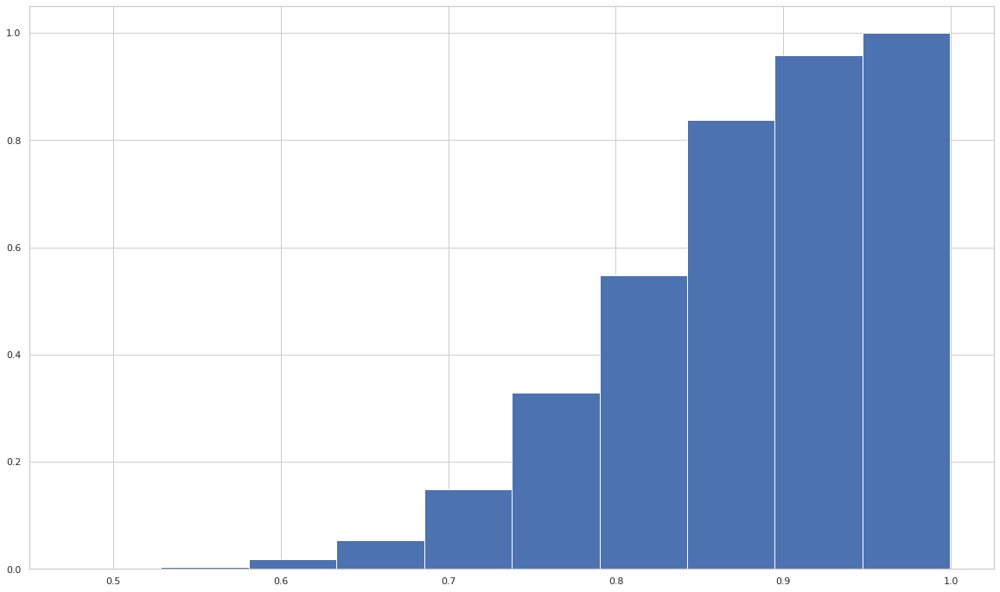

In [ ]:
get_ax()
plt.hist(aoa_filt.resample('10min').sum() / (10*60*10), cumulative=True, density=True)

(array([0.0057971 , 0.02753623, 0.07681159, 0.2115942 , 0.38695652,
        0.54637681, 0.77971014, 0.94492754, 0.98405797, 1.        ]),
 array([0.63022222, 0.66481667, 0.69941111, 0.73400556, 0.7686    ,
        0.80319444, 0.83778889, 0.87238333, 0.90697778, 0.94157222,
        0.97616667]),
 <BarContainer object of 10 artists>)

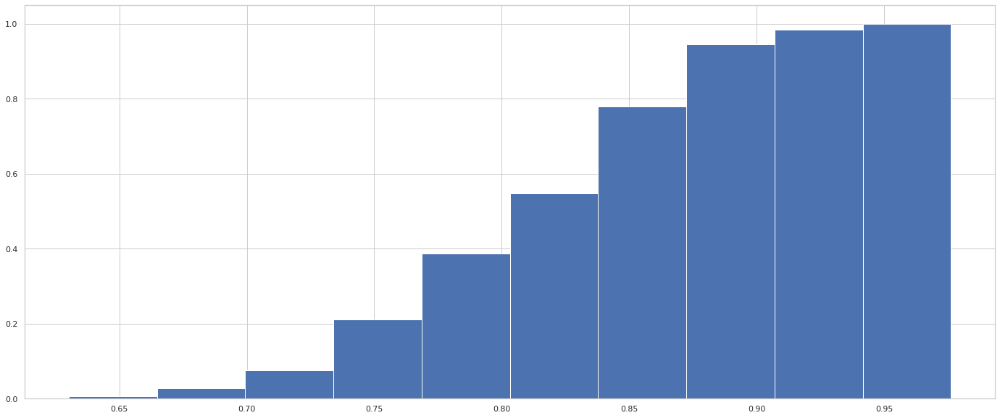

In [ ]:
get_ax()
plt.hist(aoa_filt.resample('30min').sum() / (10*60*30), cumulative=True, density=True)

(array([0.01846799, 0.05540396, 0.27701982, 0.68331556, 1.79139484,
        3.46274776, 4.1737653 , 5.53116242, 2.30849851, 0.81259147]),
 array([0.47633333, 0.52865   , 0.58096667, 0.63328333, 0.6856    ,
        0.73791667, 0.79023333, 0.84255   , 0.89486667, 0.94718333,
        0.9995    ]),
 <BarContainer object of 10 artists>)

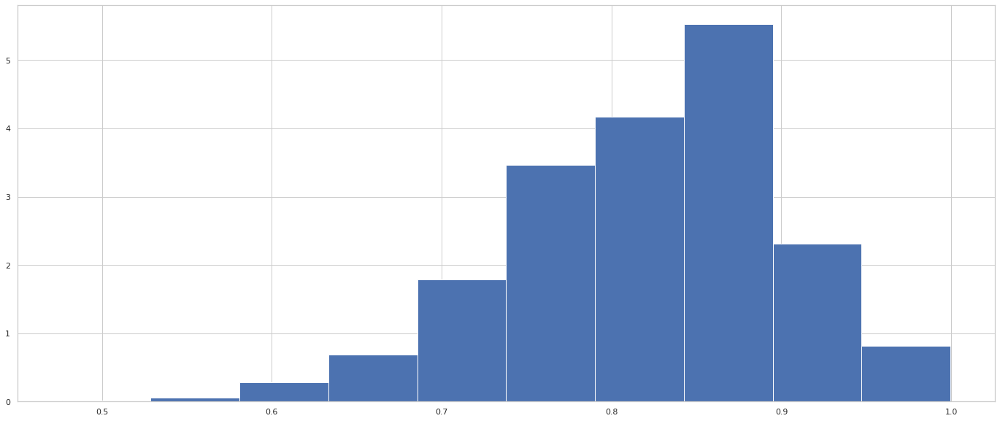

In [ ]:
get_ax()
plt.hist(aoa_filt.resample('10min').sum() / (10*60*10), cumulative=False, density=True)

In [ ]:
dfs = [df[wm1.wind_speed>.4].resample('5min').mean().dropna().pipe(add_wind_dir) for df in [wm1, TrsH, TrsV]]

/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/home/simone/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


<AxesSubplot:xlabel='wind_dir'>

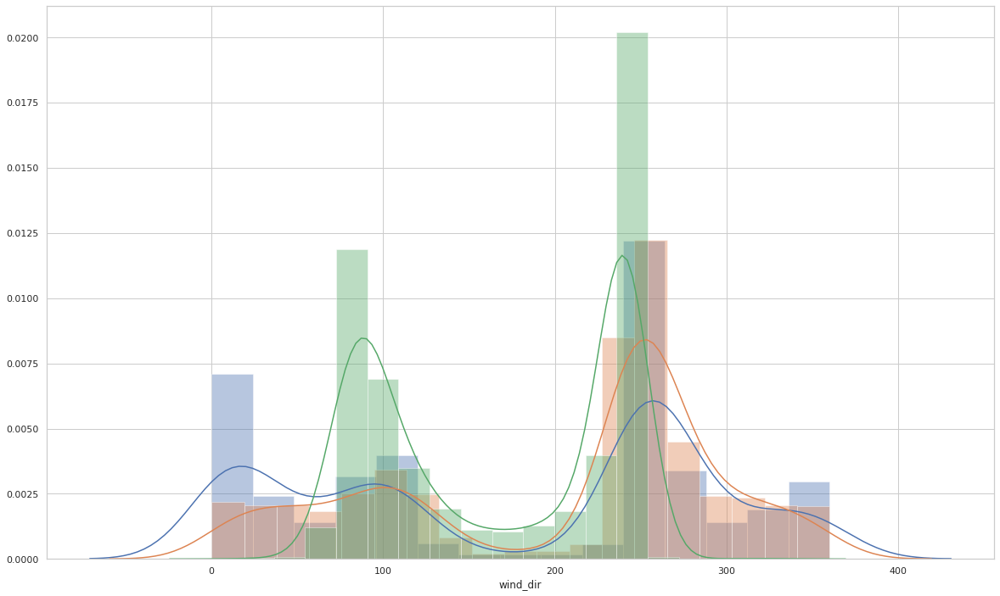

In [ ]:
get_ax()
sns.distplot(wm1[wm1.wind_speed>.4].resample('5min').mean().dropna().pipe(add_wind_dir).wind_dir)
sns.distplot(TrsH[wm1.wind_speed>.4].resample('5min').mean().dropna().pipe(add_wind_dir).wind_dir)
sns.distplot(TrsV[wm1.wind_speed>.4].resample('5min').mean().dropna().pipe(add_wind_dir).wind_dir)

Text(0.5, 1.0, 'Wind Direction at 5 mins')

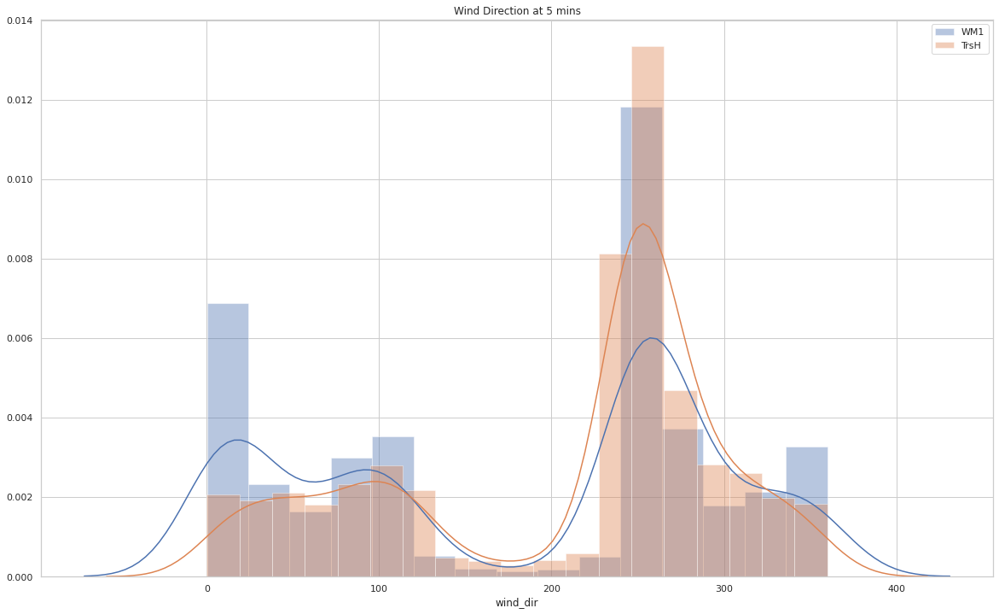

In [ ]:
get_ax()
sns.distplot(wm1.resample('5min').mean().dropna().pipe(add_wind_dir).wind_dir, **plot_info_all[0])
sns.distplot(TrsH.resample('5min').mean().dropna().pipe(add_wind_dir).wind_dir, **plot_info_all[1])
plt.legend()
plt.title("Wind Direction at 5 mins")

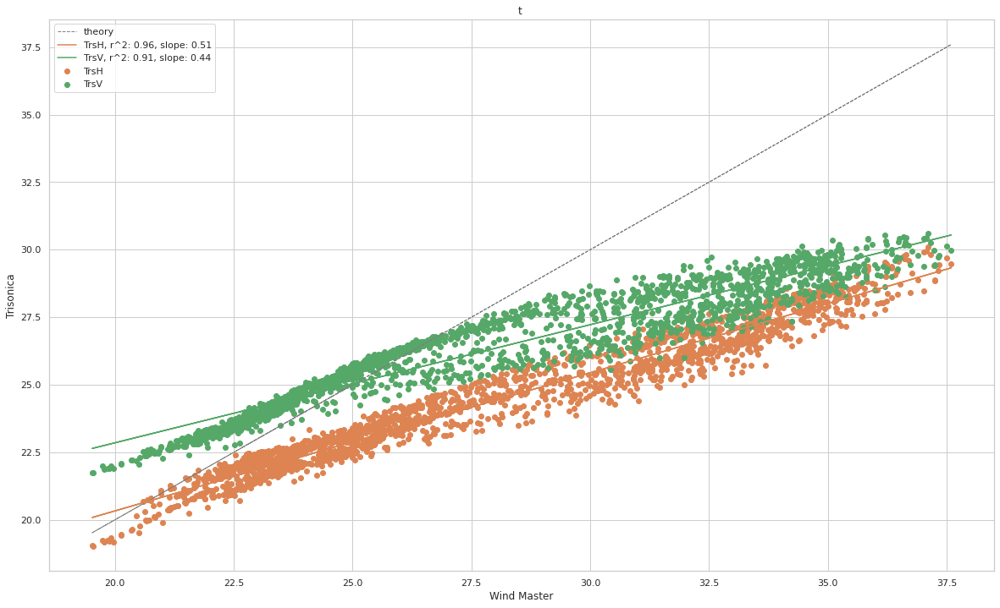

In [ ]:
plot_one_scatter(unf_10m, col='t', plot_info=plot_info_all)